# Проект предсказания музыкальных жанров в рамках конкурса на kaggle

### Загрузка данных

In [ ]:
!pip install phik -q
!pip install shap -q
!pip install imbalanced-learn -q
!pip install catboost -q
!pip install feature_engine -q

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 686.1/686.1 kB 3.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 538.2/538.2 kB 4.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 98.5/98.5 MB 8.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 328.9/328.9 kB 2.6 MB/s eta 0:00:00


In [ ]:
import pandas as pd
import numpy as np
import seaborn as sns
from matplotlib import pyplot as plt
import phik
import shap

from sklearn.feature_selection import SelectKBest, f_classif
from sklearn.pipeline import Pipeline
from sklearn.model_selection import train_test_split, RandomizedSearchCV, cross_val_score
from sklearn.preprocessing import (OneHotEncoder, OrdinalEncoder, StandardScaler,
                                   MinMaxScaler, PolynomialFeatures, LabelEncoder)
from sklearn.compose import ColumnTransformer
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import roc_auc_score
from sklearn.neighbors import KNeighborsClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.impute import  KNNImputer, SimpleImputer
from sklearn.svm import SVC
from sklearn.ensemble import RandomForestClassifier, IsolationForest
from sklearn.ensemble import StackingClassifier
from catboost import CatBoostClassifier
from imblearn.pipeline import make_pipeline
from feature_engine.selection import DropCorrelatedFeatures

import warnings
warnings.filterwarnings('ignore')
plt.style.use('dark_background')

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


Данные представленны в 3 файлах, прочитаем их и сохраним

In [ ]:
X_test = pd.read_csv('/content/drive/MyDrive/csv/kaggle_music_genre_test.csv')
df_ganre_train = pd.read_csv('/content/drive/MyDrive/csv/kaggle_music_genre_train.csv')
y_test = pd.read_csv('/content/drive/MyDrive/csv/sample_submission.csv')

In [ ]:
X_test.head()

,instance_id,track_name,popularity,acousticness,danceability,duration_ms,energy,instrumentalness,key,liveness,loudness,mode,speechiness,tempo,obtained_date,valence
0,32911,Pretty Green,30.0,0.09310,0.429,249640.0,0.862,0.000001,D,0.1610,-5.696,Major,0.0760,177.023,NaN,0.335
1,30681,Son Of The Sun,45.0,0.07120,0.507,190253.0,0.754,0.000045,A,0.3180,-6.921,Major,0.0324,?,4-Apr,0.582
2,9640,NaN,59.0,0.00413,0.559,276707.0,0.912,0.000000,F,0.0567,-6.799,Major,0.0608,103.13,4-Apr,0.653
3,40204,How I Could Just Kill a Man,61.0,0.00114,0.598,244693.0,0.939,0.000009,G,0.2880,-3.663,Major,0.1050,95.884,4-Apr,0.630
4,11034,Handsome And Wealthy,62.0,0.00348,0.858,210557.0,0.665,0.000000,NaN,0.0940,-2.907,Major,0.1010,146.031,4-Apr,0.237


In [ ]:
X_test.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10000 entries, 0 to 9999
Data columns (total 16 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   instance_id       10000 non-null  int64  
 1   track_name        7326 non-null   object 
 2   popularity        9002 non-null   float64
 3   acousticness      10000 non-null  float64
 4   danceability      9486 non-null   float64
 5   duration_ms       10000 non-null  float64
 6   energy            10000 non-null  float64
 7   instrumentalness  10000 non-null  float64
 8   key               9626 non-null   object 
 9   liveness          10000 non-null  float64
 10  loudness          10000 non-null  float64
 11  mode              9491 non-null   object 
 12  speechiness       10000 non-null  float64
 13  tempo             10000 non-null  object 
 14  obtained_date     8462 non-null   object 
 15  valence           10000 non-null  float64
dtypes: float64(10), int64(1), object(5)
memor

В первой таблице тестовые данные, 5 колонок типа object, 1 колонка типа int, 10 колонок типа float, 10000 строк

In [ ]:
df_ganre_train.head()

,instance_id,track_name,popularity,acousticness,danceability,duration_ms,energy,instrumentalness,key,liveness,loudness,mode,speechiness,tempo,obtained_date,valence,music_genre
0,28097,NaN,38.0,0.0455,NaN,152427.0,0.636,0.020200,F#,0.111,-9.109,Minor,0.0591,167.357,4-Apr,0.597,Country
1,49793,Uber Everywhere,67.0,0.0542,0.779,-1.0,0.455,0.000000,C#,0.177,-15.025,Major,0.2800,140.181,4-Apr,0.197,Rap
2,41545,Love Is All,37.0,0.5830,0.660,311008.0,0.650,0.056200,D,0.398,-7.738,Minor,0.0288,?,NaN,0.692,Jazz
3,23453,NaN,69.0,0.0122,0.680,200000.0,0.597,0.000599,E,0.114,-7.198,Minor,0.0304,120.052,4-Apr,0.300,Hip-Hop
4,33933,Should Have Known Better,64.0,0.9790,0.571,307698.0,0.172,0.275000,G,0.124,-20.700,Major,0.0318,90.97200000000001,4-Apr,0.297,Rock


In [ ]:
df_ganre_train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 40000 entries, 0 to 39999
Data columns (total 17 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   instance_id       40000 non-null  int64  
 1   track_name        29324 non-null  object 
 2   popularity        36063 non-null  float64
 3   acousticness      40000 non-null  float64
 4   danceability      37954 non-null  float64
 5   duration_ms       40000 non-null  float64
 6   energy            40000 non-null  float64
 7   instrumentalness  40000 non-null  float64
 8   key               38624 non-null  object 
 9   liveness          40000 non-null  float64
 10  loudness          40000 non-null  float64
 11  mode              38174 non-null  object 
 12  speechiness       40000 non-null  float64
 13  tempo             40000 non-null  object 
 14  obtained_date     33738 non-null  object 
 15  valence           40000 non-null  float64
 16  music_genre       40000 non-null  object

Вторая таблица состоит из тренировачных данных, колонки идентичны первой таблице, включая целевой признак music_genre(категориальный признак), 40000 строк

In [ ]:
y_test.head()

,instance_id,music_genre
0,32911,Rap
1,30681,Country
2,9640,Classical
3,40204,Anime
4,11034,Country


In [ ]:
y_test.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10000 entries, 0 to 9999
Data columns (total 2 columns):
 #   Column       Non-Null Count  Dtype 
---  ------       --------------  ----- 
 0   instance_id  10000 non-null  int64 
 1   music_genre  10000 non-null  object
dtypes: int64(1), object(1)
memory usage: 156.4+ KB


Третья таблица состоит из id и целевого признака тренировачных данных, 10000 строк

### Предобработка данных

In [ ]:
df_ganre_train.isna().mean()

instance_id         0.000000
track_name          0.266900
popularity          0.098425
acousticness        0.000000
danceability        0.051150
duration_ms         0.000000
energy              0.000000
instrumentalness    0.000000
key                 0.034400
liveness            0.000000
loudness            0.000000
mode                0.045650
speechiness         0.000000
tempo               0.000000
obtained_date       0.156550
valence             0.000000
music_genre         0.000000
dtype: float64

In [ ]:
X_test.isna().mean()

instance_id         0.0000
track_name          0.2674
popularity          0.0998
acousticness        0.0000
danceability        0.0514
duration_ms         0.0000
energy              0.0000
instrumentalness    0.0000
key                 0.0374
liveness            0.0000
loudness            0.0000
mode                0.0509
speechiness         0.0000
tempo               0.0000
obtained_date       0.1538
valence             0.0000
dtype: float64

In [ ]:
y_test.isna().mean()

instance_id    0.0
music_genre    0.0
dtype: float64

Наблюдаем пропуски в данных, заполнение реализуем внутри пайплайна

In [ ]:
df_ganre_train.duplicated().sum()

0

In [ ]:
X_test.duplicated().sum()

0

In [ ]:
y_test.duplicated().sum()

0

Явных дубликатов не наблюдаем

In [ ]:
df_ganre_train.head()

,instance_id,track_name,popularity,acousticness,danceability,duration_ms,energy,instrumentalness,key,liveness,loudness,mode,speechiness,tempo,obtained_date,valence,music_genre
0,28097,NaN,38.0,0.0455,NaN,152427.0,0.636,0.020200,F#,0.111,-9.109,Minor,0.0591,167.357,4-Apr,0.597,Country
1,49793,Uber Everywhere,67.0,0.0542,0.779,-1.0,0.455,0.000000,C#,0.177,-15.025,Major,0.2800,140.181,4-Apr,0.197,Rap
2,41545,Love Is All,37.0,0.5830,0.660,311008.0,0.650,0.056200,D,0.398,-7.738,Minor,0.0288,?,NaN,0.692,Jazz
3,23453,NaN,69.0,0.0122,0.680,200000.0,0.597,0.000599,E,0.114,-7.198,Minor,0.0304,120.052,4-Apr,0.300,Hip-Hop
4,33933,Should Have Known Better,64.0,0.9790,0.571,307698.0,0.172,0.275000,G,0.124,-20.700,Major,0.0318,90.97200000000001,4-Apr,0.297,Rock


In [ ]:
df_ganre_train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 40000 entries, 0 to 39999
Data columns (total 17 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   instance_id       40000 non-null  int64  
 1   track_name        29324 non-null  object 
 2   popularity        36063 non-null  float64
 3   acousticness      40000 non-null  float64
 4   danceability      37954 non-null  float64
 5   duration_ms       40000 non-null  float64
 6   energy            40000 non-null  float64
 7   instrumentalness  40000 non-null  float64
 8   key               38624 non-null  object 
 9   liveness          40000 non-null  float64
 10  loudness          40000 non-null  float64
 11  mode              38174 non-null  object 
 12  speechiness       40000 non-null  float64
 13  tempo             40000 non-null  object 
 14  obtained_date     33738 non-null  object 
 15  valence           40000 non-null  float64
 16  music_genre       40000 non-null  object

Наблюдаем некорректный тип данных колонки tempo и непонятное значение '?', заменим его на nan

In [ ]:
df_ganre_train['tempo'].unique()

array(['167.357', '140.181', '?', ..., '116.955', '151.375', '171.882'],
      dtype=object)

In [ ]:
df_ganre_train['tempo'] = df_ganre_train['tempo'].apply(lambda x: np.nan if x == '?' else x)
df_ganre_train['tempo'] = df_ganre_train['tempo'].astype(float)
df_ganre_train['tempo']

0        167.357
1        140.181
2            NaN
3        120.052
4         90.972
          ...   
39995    151.375
39996    112.038
39997    171.882
39998    174.062
39999     77.021
Name: tempo, Length: 40000, dtype: float64

Проделываем ту же операцию с тестовыми данными

In [ ]:
X_test['tempo'] = X_test['tempo'].apply(lambda x: np.nan if x == '?' else x)
X_test['tempo'] = X_test['tempo'].astype(float)
X_test['tempo']

0       177.023
1           NaN
2       103.130
3        95.884
4       146.031
         ...   
9995    122.019
9996    133.965
9997     94.997
9998    165.866
9999    109.955
Name: tempo, Length: 10000, dtype: float64

In [ ]:
df_ganre_train['music_genre'].unique()

array(['Country', 'Rap', 'Jazz', 'Hip-Hop', 'Rock', 'Alternative',
       'Classical', 'Electronic', 'Anime', 'Blues'], dtype=object)

In [ ]:
y_test['music_genre'].unique()

array(['Rap', 'Country', 'Classical', 'Anime', 'Rock', 'Blues',
       'Electronic', 'Hip-Hop', 'Alternative', 'Jazz'], dtype=object)

In [ ]:
X_test.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10000 entries, 0 to 9999
Data columns (total 16 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   instance_id       10000 non-null  int64  
 1   track_name        7326 non-null   object 
 2   popularity        9002 non-null   float64
 3   acousticness      10000 non-null  float64
 4   danceability      9486 non-null   float64
 5   duration_ms       10000 non-null  float64
 6   energy            10000 non-null  float64
 7   instrumentalness  10000 non-null  float64
 8   key               9626 non-null   object 
 9   liveness          10000 non-null  float64
 10  loudness          10000 non-null  float64
 11  mode              9491 non-null   object 
 12  speechiness       10000 non-null  float64
 13  tempo             9016 non-null   float64
 14  obtained_date     8462 non-null   object 
 15  valence           10000 non-null  float64
dtypes: float64(11), int64(1), object(4)
memor

In [ ]:
df_ganre_train['key'].unique()

array(['F#', 'C#', 'D', 'E', 'G', 'A', nan, 'B', 'F', 'C', 'A#', 'G#',
       'D#'], dtype=object)

In [ ]:
X_test['key'].unique()

array(['D', 'A', 'F', 'G', nan, 'G#', 'C#', 'B', 'C', 'D#', 'F#', 'E',
       'A#'], dtype=object)

Значение колонки key-базовый ключ (нота) произведения преобразуем в новый признак с частотой ноты (взятой в первой октаве), тк частота будет содержать больше информации для модели нежели категориальный признак

In [ ]:
def кey_frequency_func(row):
    if 'C' in row:   # До первой октавы
        return 261.63
    elif 'C#' in row:  # До-диез первой октавы
        return 277.18
    elif 'D' in row:  # Ре первой октавы
        return 293.66
    elif 'D#' in row:  # 	Ре-диез первой октавы
        return 311.13
    elif 'E' in row:  # Ми первой октавы
        return 329.63
    elif 'F' in row:  # Фа первой октавы
        return 349.23
    elif 'F#' in row:  # Фа-диез первой октавы
        return 369.99
    elif 'G' in row:  # Соль первой октавы
        return 392.00
    elif 'G#' in row:  # Соль-диез первой октавы
        return 415.30
    elif 'A' in row:  # Ля первой октавы
        return 440.00
    elif 'A#' in row:  # Ля-диез первой октавы
        return 466.16
    elif 'B' in row:  # Си первой октавы
        return 	493.88
    else:
        return np.nan

In [ ]:
df_ganre_train['key_frequency'] = df_ganre_train['key'].fillna('').apply(кey_frequency_func)
df_ganre_train['key_frequency'].head()

0    349.23
1    261.63
2    293.66
3    329.63
4    392.00
Name: key_frequency, dtype: float64

In [ ]:
X_test['key_frequency'] = X_test['key'].fillna('').apply(кey_frequency_func)
X_test['key_frequency'].head()

0    293.66
1    440.00
2    349.23
3    392.00
4       NaN
Name: key_frequency, dtype: float64

In [ ]:
df_ganre_train['key_frequency'].unique()

array([349.23, 261.63, 293.66, 329.63, 392.  , 440.  ,    nan, 493.88])

In [ ]:
df_ganre_train['obtained_date'].unique()

array(['4-Apr', nan, '3-Apr', '5-Apr', '1-Apr', '0/4'], dtype=object)

Заменим некорректное значение '0/4' на nan

In [ ]:
df_ganre_train['obtained_date'] = df_ganre_train['obtained_date'].apply(lambda x: np.nan if x == '0/4' else x)
df_ganre_train['obtained_date'].unique()

array(['4-Apr', nan, '3-Apr', '5-Apr', '1-Apr'], dtype=object)

Добавим новый признак со значением длины названия трека взятого с признаки track_name

In [ ]:
df_ganre_train['len_name'] = df_ganre_train['track_name'].fillna('_').apply(lambda x: len(x) if x!= '_' else x)
df_ganre_train['len_name'] = df_ganre_train['len_name'].apply(lambda x: np.nan if x == '_' else x)
df_ganre_train['len_name']

0          NaN
1         15.0
2         11.0
3          NaN
4         24.0
         ...  
39995    108.0
39996      9.0
39997      NaN
39998     12.0
39999     21.0
Name: len_name, Length: 40000, dtype: float64

In [ ]:
X_test['len_name'] = X_test['track_name'].fillna('_').apply(lambda x: len(x) if x!= '_' else x)
X_test['len_name'] = X_test['len_name'].apply(lambda x: np.nan if x == '_' else x)
X_test['len_name']

0       12.0
1       14.0
2        NaN
3       27.0
4       20.0
        ... 
9995     7.0
9996    23.0
9997    21.0
9998     9.0
9999    12.0
Name: len_name, Length: 10000, dtype: float64

Проверим индексацию признаков тестовых данных:

In [ ]:
pd.concat([X_test['instance_id'], y_test['instance_id']], axis=1)

,instance_id,instance_id
0,32911,32911
1,30681,30681
2,9640,9640
3,40204,40204
4,11034,11034
...,...,...
9995,39792,39792
9996,35928,35928
9997,16758,16758
9998,18788,18788


### Исследовательский анализ данных (train)

#### Категориальные признаки

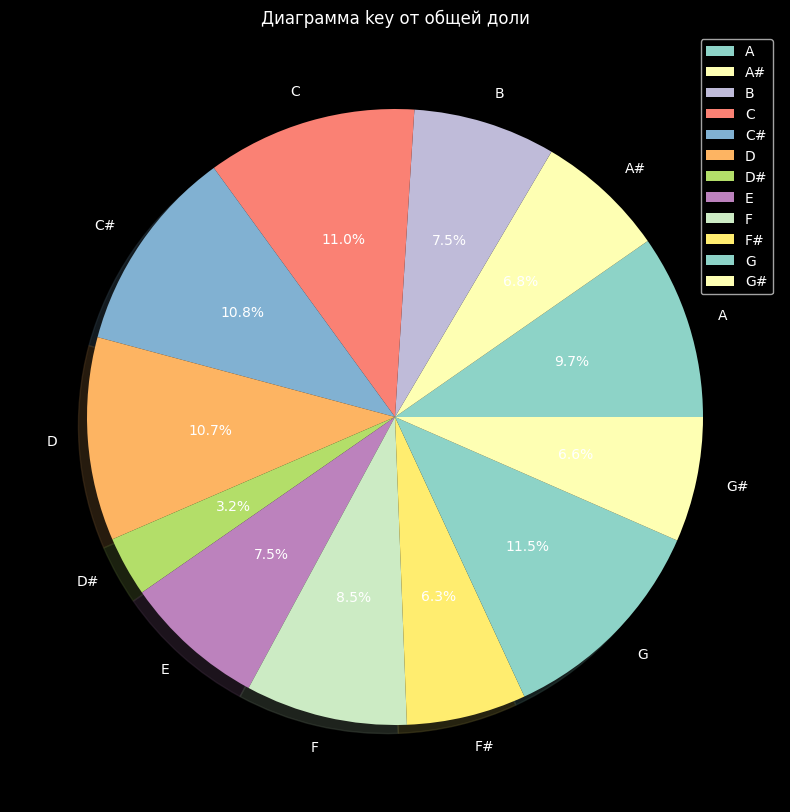

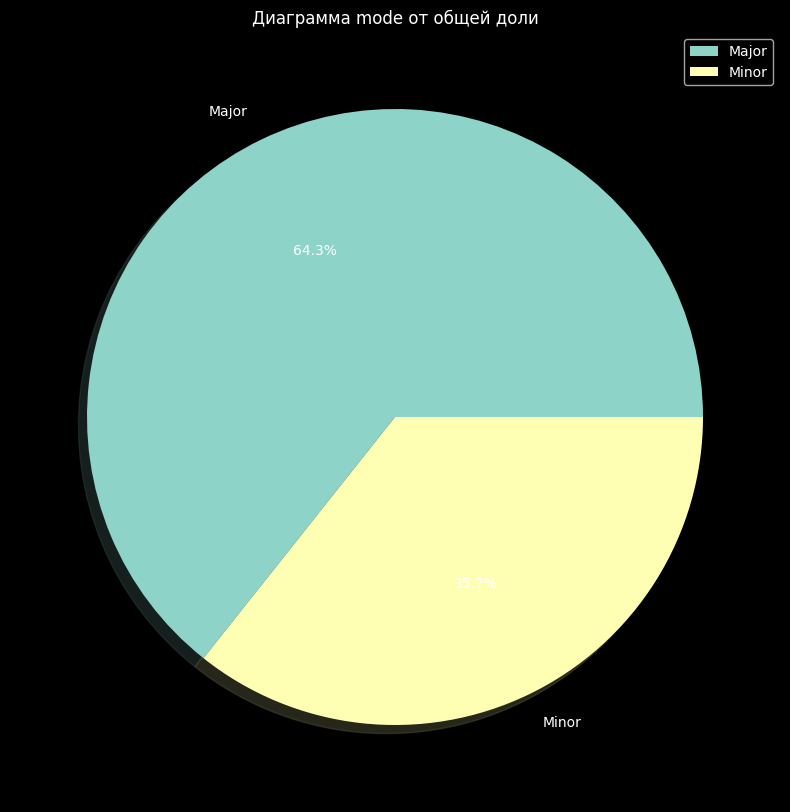

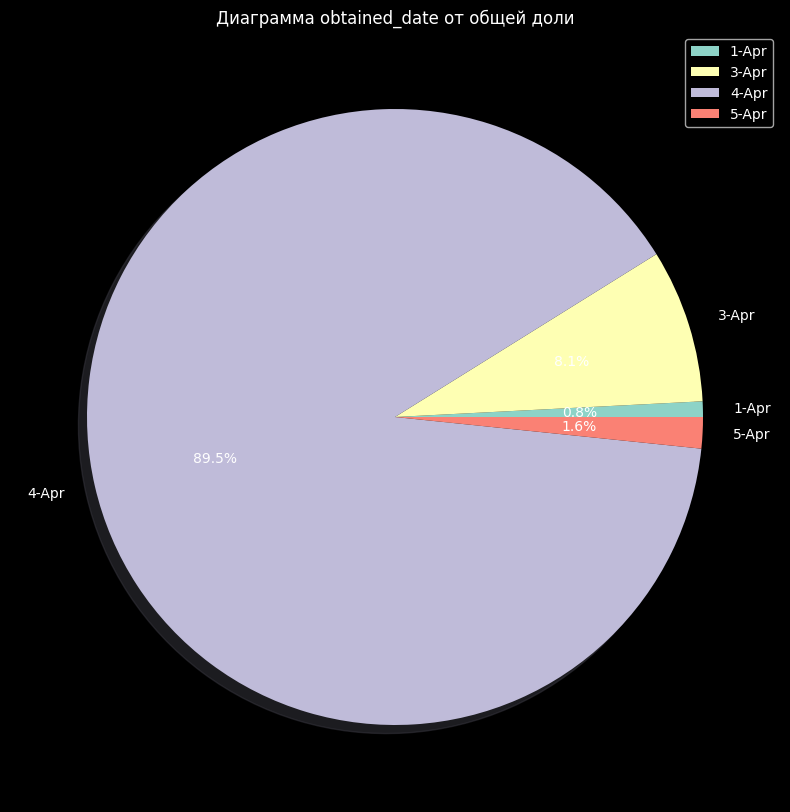

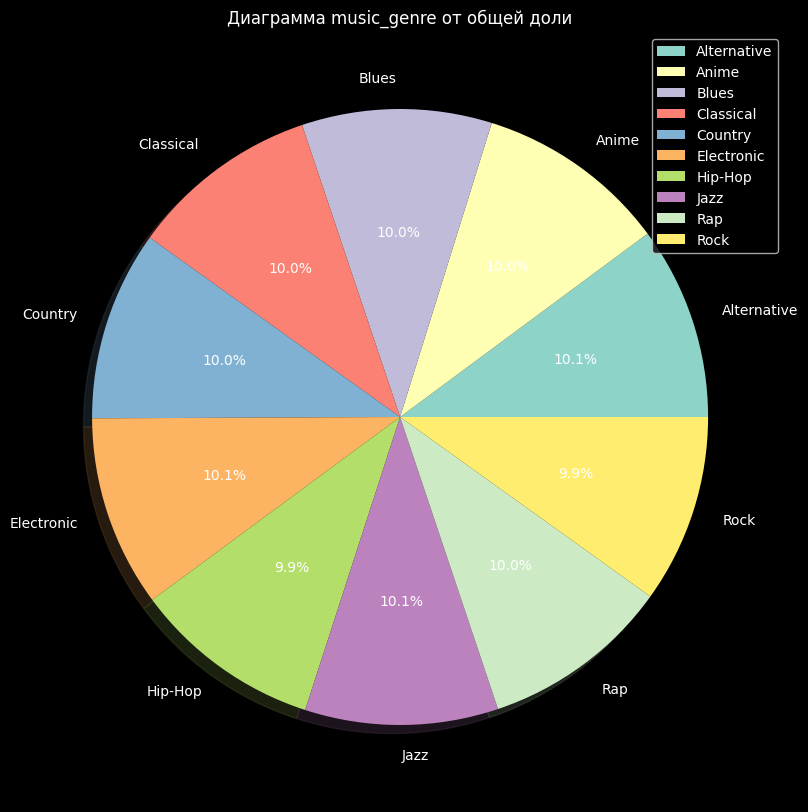

In [ ]:
for colum in ['key', 'mode', 'obtained_date', 'music_genre']:
    fig, ax = plt.subplots(figsize=(12, 10))
    x = df_ganre_train.groupby(colum)['instance_id'].count()
    x = (x/len(df_ganre_train) * 100).reset_index()
    labels = x[colum]
    x = x['instance_id']
    plt.pie(x, labels=labels, autopct='%1.1f%%', shadow=True)
    plt.legend(loc="best")
    plt.title('Диаграмма '+ colum +' от общей доли')
    plt.show()
    print()

-Значения 'key'(базовый ключ произведения) ноты распределенны +- равномерно по данным тренировочного датасета

-Значения 'mode'(модальность трека) преобладает мажорная модальность в треках(64.3%), минорная (35.7%)

-Значения 'obtained_date'(дата загрузки в сервис) в основном все треки в сервис загрузили 4 апреля(89.5%), 3 апреля (8.1%). 1 апреля, 5 апреля загруженно остаточные ~ 2% треков

-Значения цeлевого признака 'music_genre '(Музыкальный жанр трека) почти идеально сбалансированны по данным 9.9-10.1%, таковых значений 10

#### Кол-ые признаки

popularity
count    36063.000000
mean        44.127638
std         15.560746
min          0.000000
25%         34.000000
50%         45.000000
75%         55.000000
max         99.000000
Name: popularity, dtype: float64


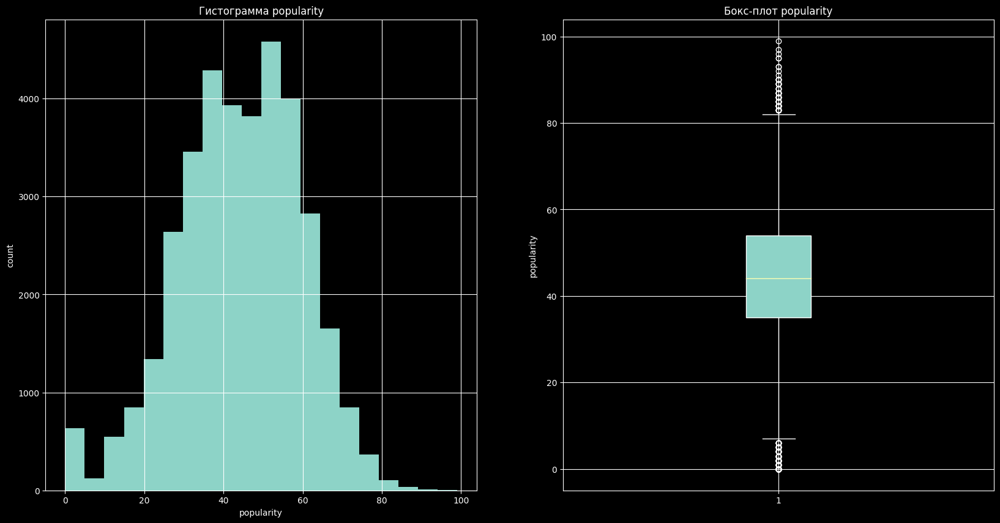

acousticness
count    40000.000000
mean         0.305768
std          0.341469
min          0.000000
25%          0.020000
50%          0.143000
75%          0.551000
max          0.996000
Name: acousticness, dtype: float64


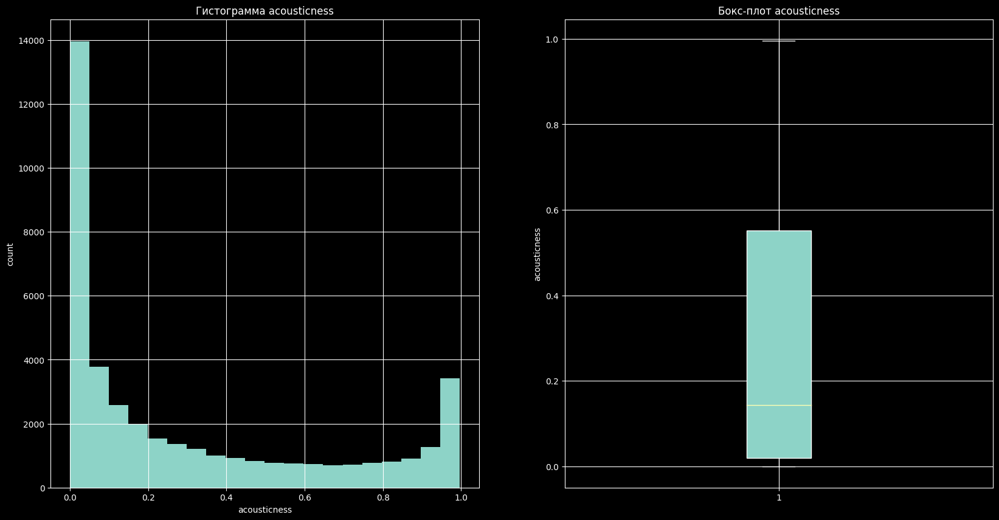

danceability
count    37954.000000
mean         0.558238
std          0.178369
min          0.059600
25%          0.442000
50%          0.568000
75%          0.687000
max          0.986000
Name: danceability, dtype: float64


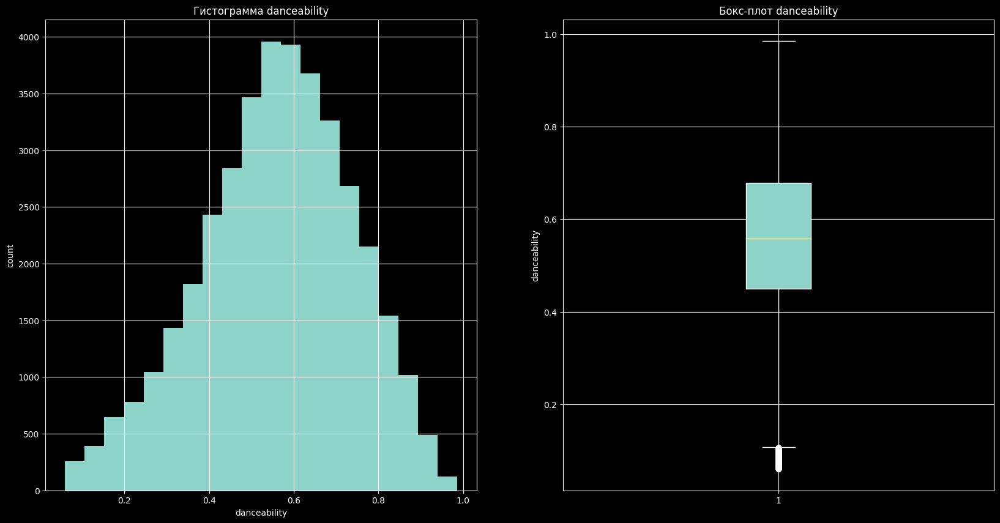

duration_ms
count    4.000000e+04
mean     2.210808e+05
std      1.296118e+05
min     -1.000000e+00
25%      1.747938e+05
50%      2.191420e+05
75%      2.684800e+05
max      4.830606e+06
Name: duration_ms, dtype: float64


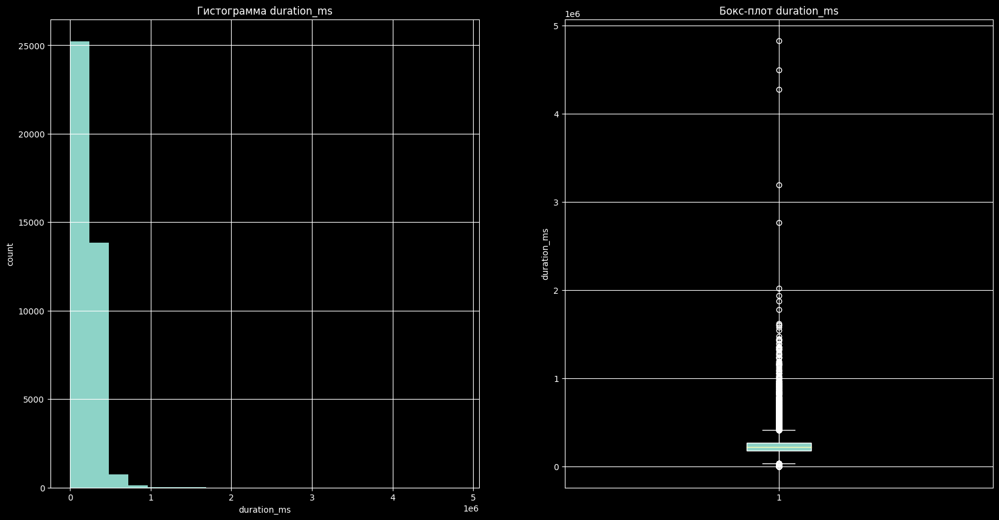

energy
count    40000.000000
mean         0.600285
std          0.264544
min          0.000792
25%          0.432000
50%          0.644000
75%          0.817000
max          0.999000
Name: energy, dtype: float64


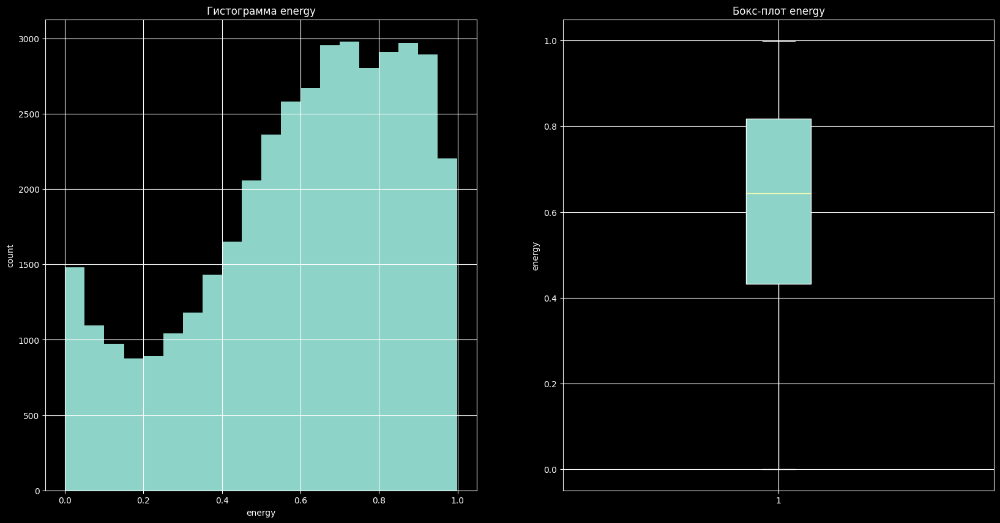

instrumentalness
count    40000.000000
mean         0.181791
std          0.325417
min          0.000000
25%          0.000000
50%          0.000150
75%          0.155000
max          0.994000
Name: instrumentalness, dtype: float64


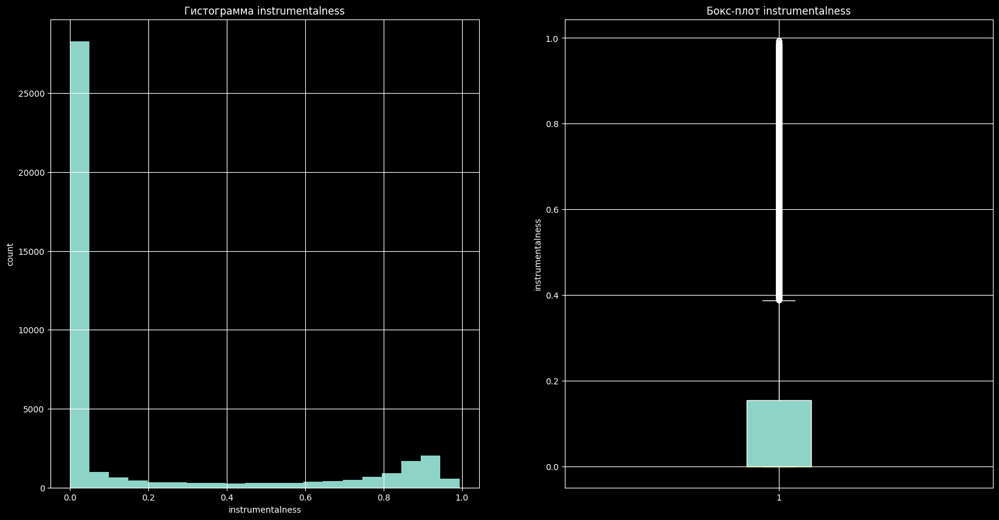

liveness
count    40000.000000
mean         0.193809
std          0.160886
min          0.009670
25%          0.096900
50%          0.127000
75%          0.243250
max          1.000000
Name: liveness, dtype: float64


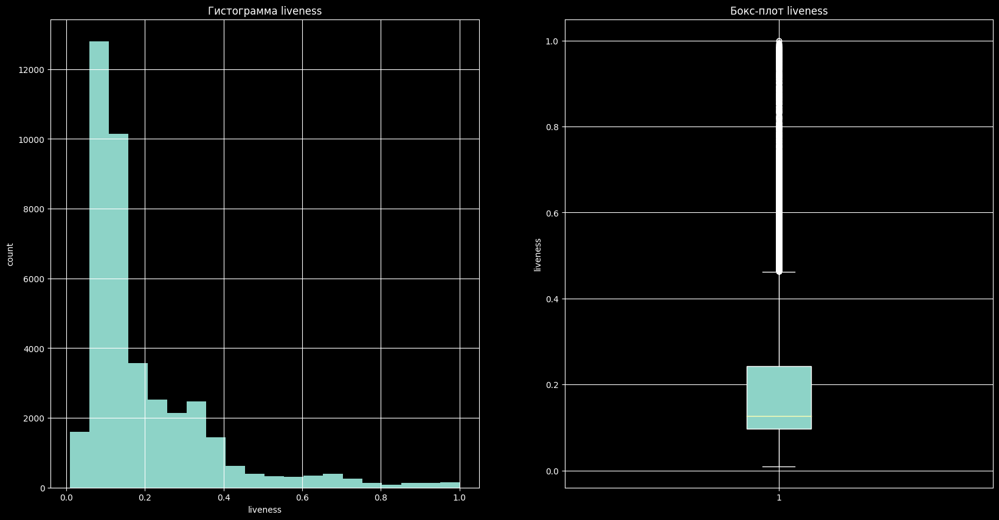

loudness
count    40000.000000
mean       -11.667314
std         14.509358
min       -108.358000
25%        -11.525000
50%         -7.456000
75%         -5.246000
max          1.949000
Name: loudness, dtype: float64


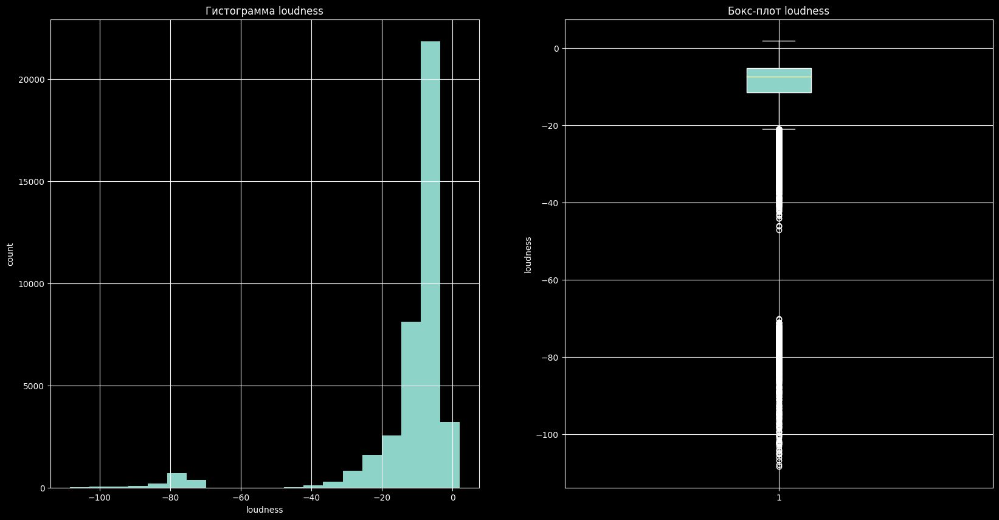

speechiness
count    40000.000000
mean         0.129875
std          0.212324
min          0.022300
25%          0.036400
50%          0.050400
75%          0.114000
max          1.889000
Name: speechiness, dtype: float64


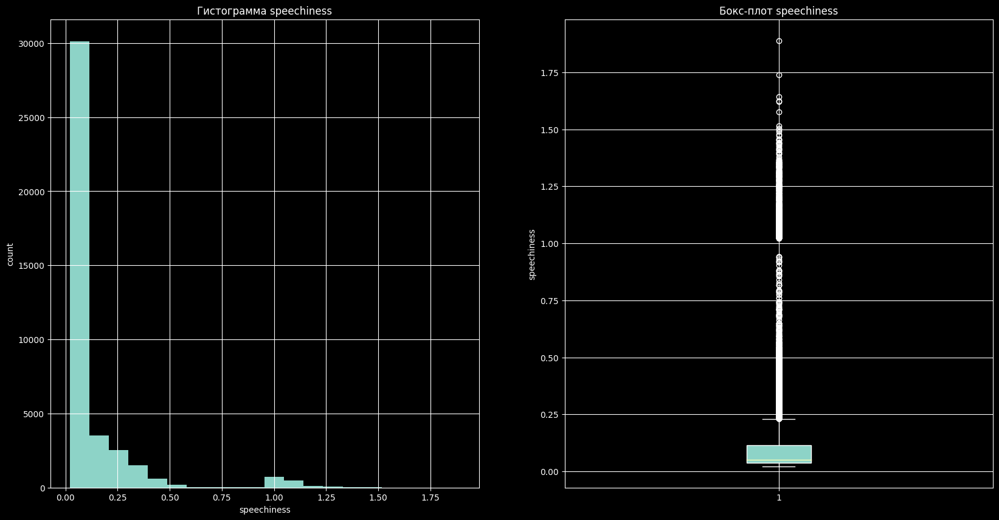

tempo
count    36004.000000
mean       119.933094
std         30.638998
min         34.469000
25%         94.878000
50%        119.865000
75%        140.410250
max        220.276000
Name: tempo, dtype: float64


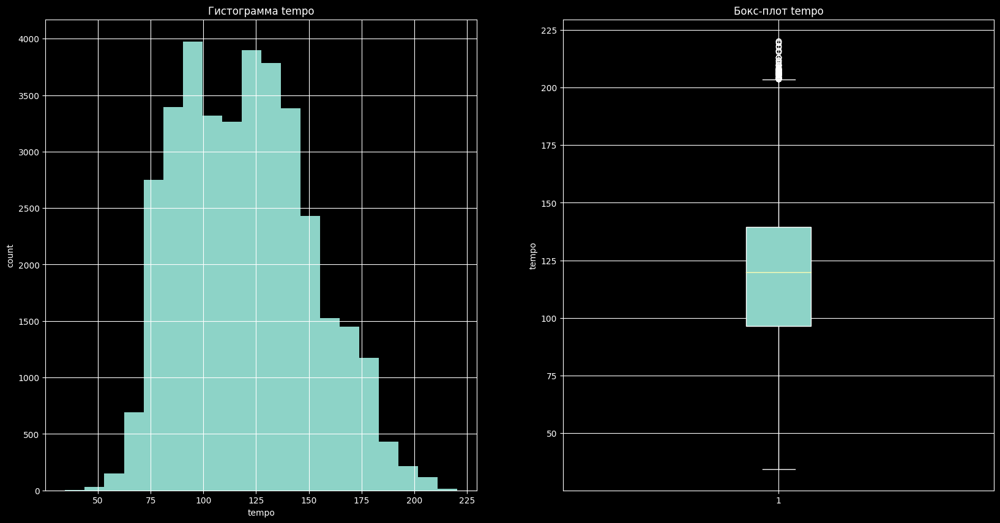

valence
count    40000.000000
mean         0.457100
std          0.247123
min          0.000000
25%          0.257000
50%          0.450500
75%          0.649000
max          0.992000
Name: valence, dtype: float64


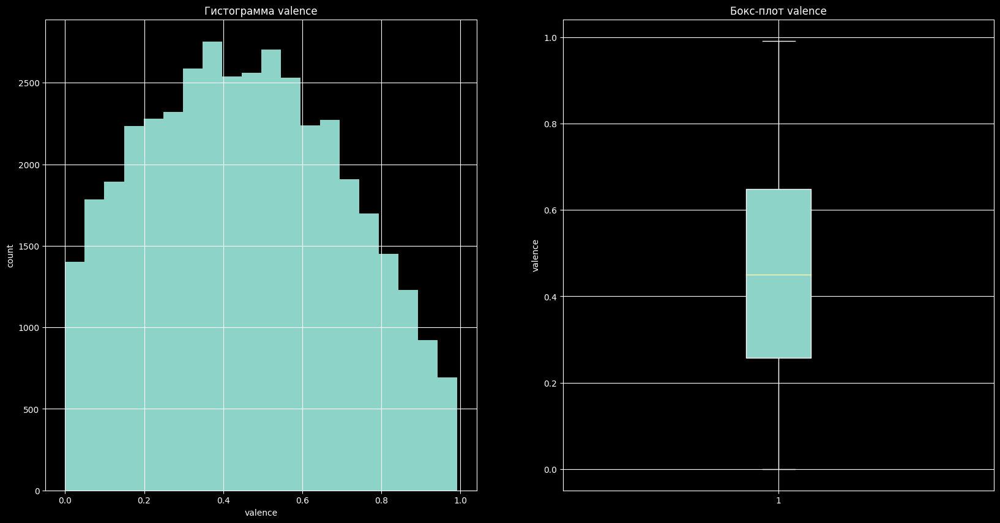

len_name
count    29324.000000
mean        20.234757
std         17.197210
min          1.000000
25%         10.000000
50%         15.000000
75%         25.000000
max        242.000000
Name: len_name, dtype: float64


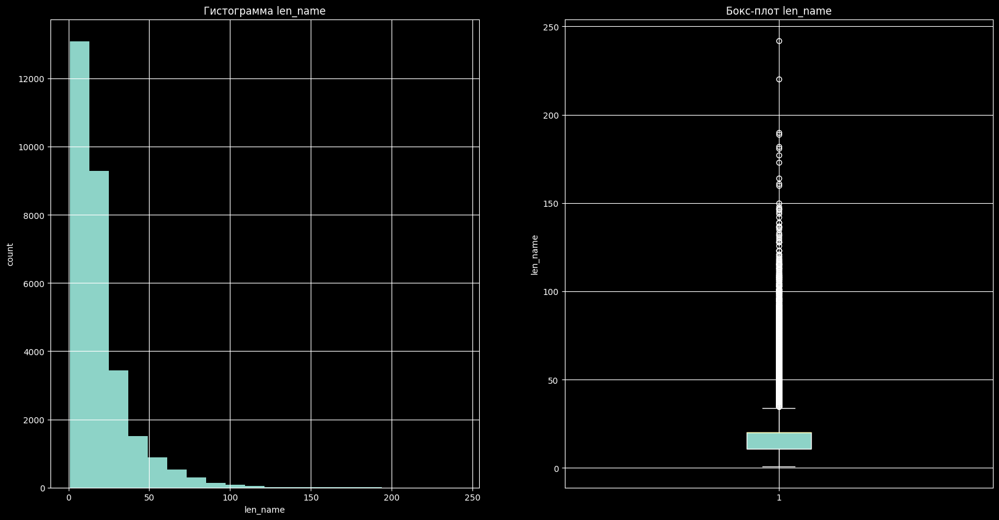

In [ ]:
for colum in ['popularity', 'acousticness', 'danceability', 'duration_ms',
              'energy', 'instrumentalness', 'liveness', 'loudness', 'speechiness',
              'tempo', 'valence', 'len_name']:
    print(colum)
    print(df_ganre_train[colum].describe())
    fig, ax = plt.subplots(nrows=1, ncols=2, figsize=(20, 10))

    ax[0].hist(df_ganre_train[colum], bins=20)
    ax[0].set_title('Гистограмма ' + colum)
    ax[0].set_xlabel(colum)
    ax[0].set_ylabel('count')
    ax[0].grid(True)

    if df_ganre_train[colum].isna().sum() != 0:
        ax[1].boxplot(df_ganre_train[colum].fillna(df_ganre_train[colum].mean()), patch_artist=True)

    else:
        ax[1].boxplot(df_ganre_train[colum], patch_artist=True)

    ax[1].set_ylabel(colum)
    ax[1].set_title('Бокс-плот ' + colum)
    ax[1].grid(True)
    plt.show()

-**'popularity'**(Популярность трека) напоминает нормальное распределение разброс варьируется от 0 до 99, в среднем 44

Присутсвуют слегка выбивающиеся значения по обе стороны распределения

-**'acousticness'**(Мера уверенности) напоминает распределение Пуасона со 'скосом' к левому краю разброс варьируется от 0 до 1, в среднем 0.3

Аномальных значений не наблюдаем

-**'danceability'**(Танцевальность) напоминает нормальное распределение разброс варьируется от 0.05 до 0.98, в среднем 0.55

Значения находящиеся в левой части распределения слегка выбиваются из общей массы

-**'duration_ms'**(Продолжительность трека в миллисекундах) напоминает распределение Пуасона смещенное к левому краю разброс варьируется от -1 до 4830000, в среднем 221000

Есть аномальные значения по правому краю распределения

-**'energy'**(Энергия) напоминает нормальное распределение смещенное к правому краю разброс варьируется от 0 до 0.99, в среднем 0.6

Аномальных значений не наблюдаем

-**'instrumentalness'**(содержит ли трек вокал)  напоминает распределение Пуасона смещенное к левому краю разброс варьируется от 0 до 0.99, в среднем 0.18

Есть аномальные значения по правому краю распределения

-**'liveness'**(присутствие аудитории в записи)  напоминает распределение Пуасона смещенное к левому краю разброс варьируется от 0 до 1, в среднем 0.19

Есть аномальные значения по правому краю распределения

-**'loudness'**(Общая громкость трека в децибелах)  напоминает распределение Пуасона смещенное к правому краю разброс варьируется от -108 до 1.94, в среднем -11

Есть аномальные значения по левому краю распределения

-**'speechiness'**(Речевой характер)  напоминает распределение Пуасона смещенное к левому краю разброс варьируется от 0.02 до 1.88, в среднем 0.12

Есть аномальные значения по правому краю распределения

-**'tempo'**(Темп трека в ударах в минуту) напоминает нормальное распределение разброс варьируется от 34 до 220, в среднем 119

Значения находящиеся в правой части распределения слегка выбиваются из общей массы

-**'valence'**(музыкальный позитив) напоминает нормальное распределение разброс варьируется от 0 до 0.99, в среднем 0.45

Аномальных значений не наблюдаем

-**'len_name'**(длина названия трека) напоминает распределение Пуасона смещенное к левому краю разброс варьируется от 1 до 242, в среднем 20

Есть аномальные значения по правому краю распределения

### Исследовательский анализ данных (test)

#### Категориальные признаки

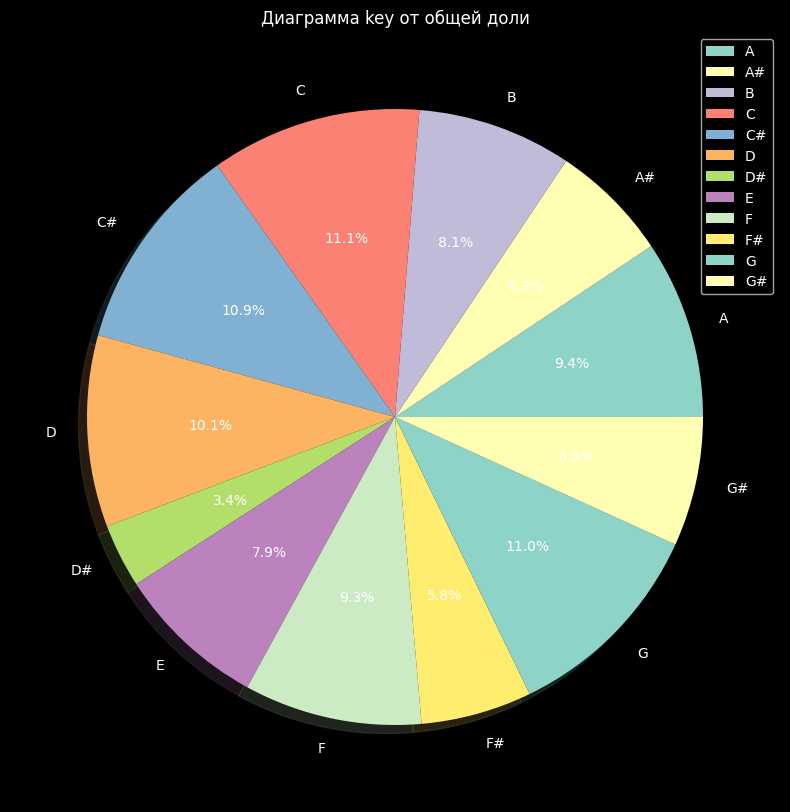

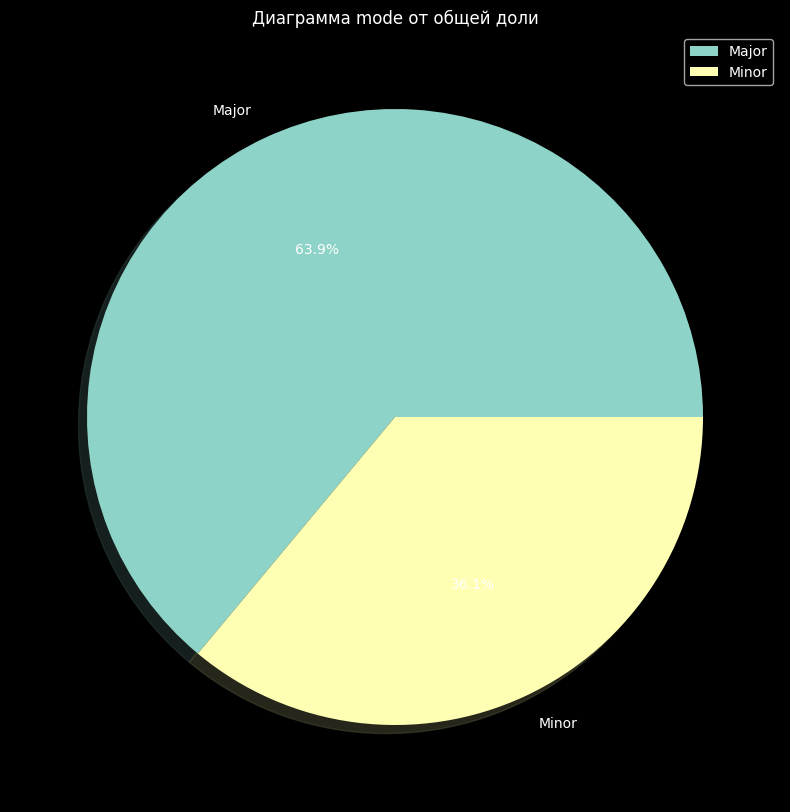

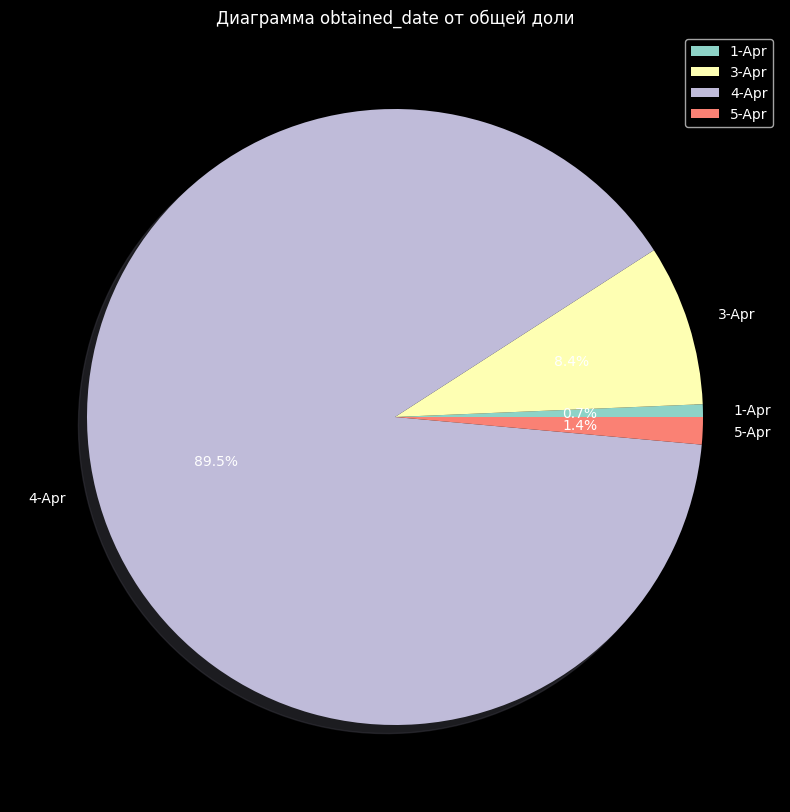

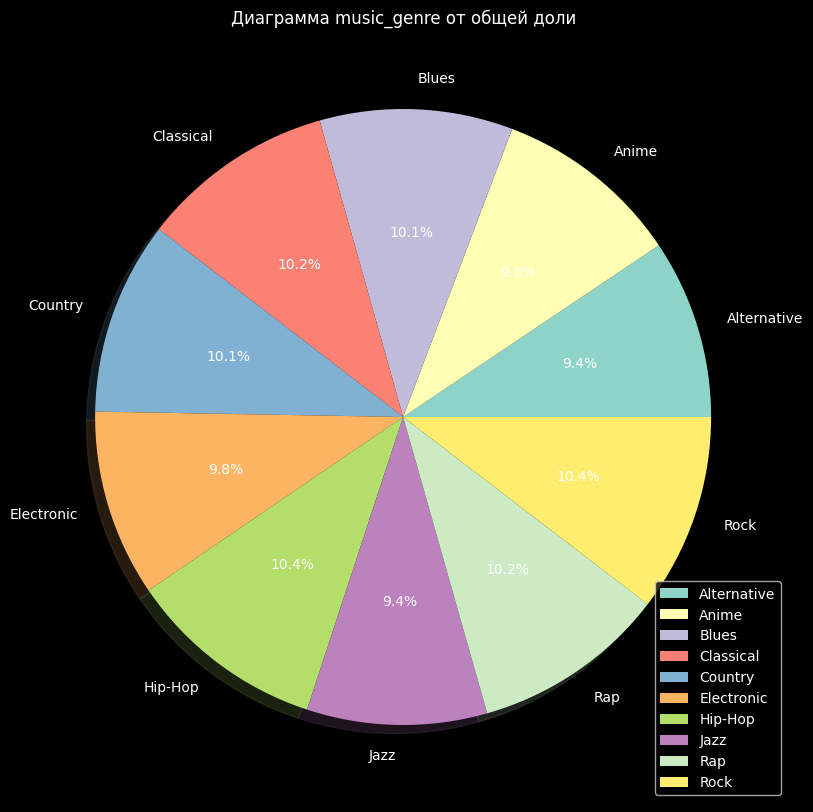

In [ ]:
for colum in ['key', 'mode', 'obtained_date', 'music_genre']:
    fig, ax = plt.subplots(figsize=(12, 10))
    x = pd.concat([X_test, y_test['music_genre']], axis=1).groupby(colum)['instance_id'].count()
    x = (x/len(pd.concat([X_test, y_test['music_genre']], axis=1)) * 100).reset_index()
    labels = x[colum]
    x = x['instance_id']
    plt.pie(x, labels=labels, autopct='%1.1f%%', shadow=True)
    plt.legend(loc="best")
    plt.title('Диаграмма '+ colum +' от общей доли')
    plt.show()
    print()

-Значения 'key'(базовый ключ произведения) ноты распределенны +- равномерно по данным тестового датасета за исключением D#(3.4%)

-Значения 'mode'(модальность трека) преобладает мажорная модальность в треках(63.9%), минорная (36.1%)

-Значения 'obtained_date'(дата загрузки в сервис) в основном все треки в сервис загрузили 4 апреля(89.5%), 3 апреля (8.4%). 1 апреля, 5 апреля загруженно остаточные ~ 2% треков

-Значения цeлевого признака 'music_genre '(Музыкальный жанр трека) чуть больше разбалансированны по данным 9.4-10.4% в сравнении с тренировочными данными, 10 значений признака

#### Кол-ые признаки


popularity
count    9002.000000
mean       44.526105
std        15.389309
min         0.000000
25%        34.000000
50%        45.000000
75%        56.000000
max        96.000000
Name: popularity, dtype: float64


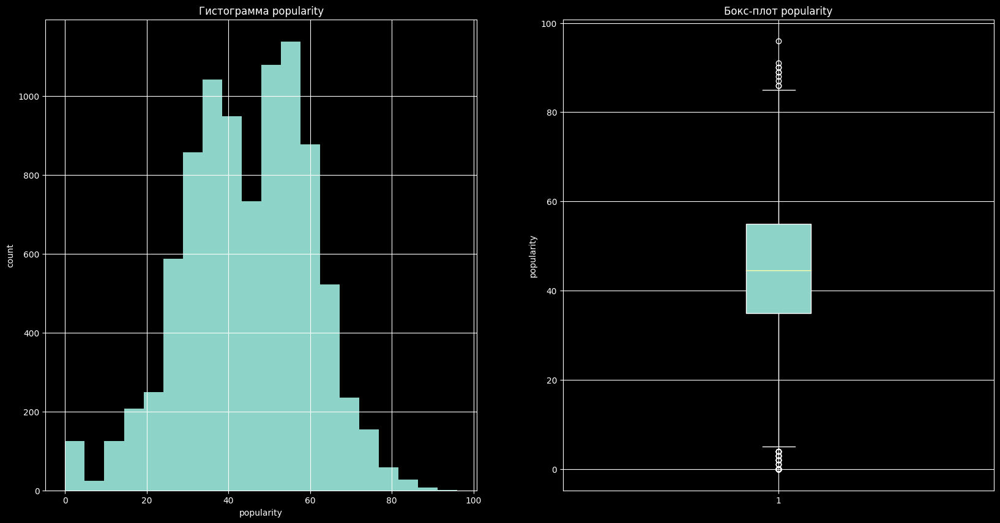

acousticness
count    10000.000000
mean         0.308840
std          0.340828
min          0.000002
25%          0.020475
50%          0.149000
75%          0.554000
max          0.996000
Name: acousticness, dtype: float64


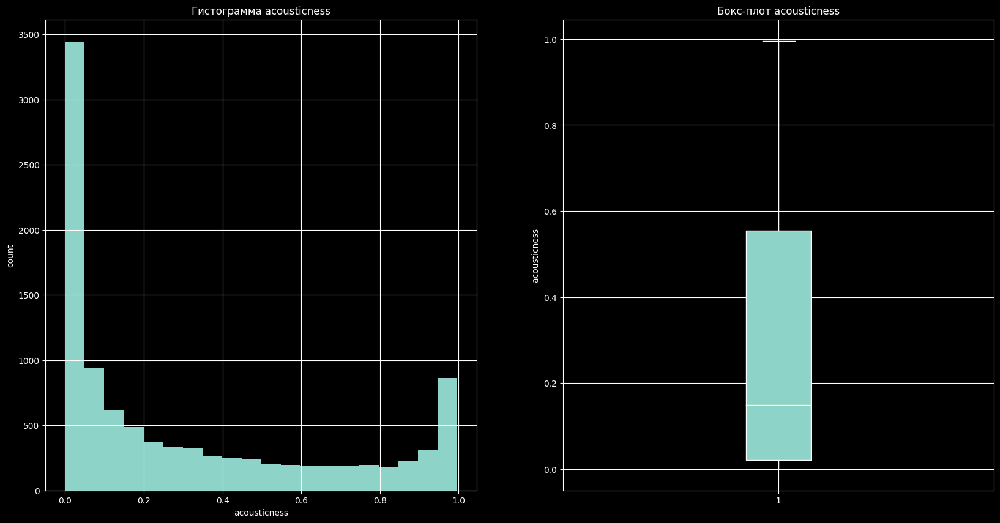

danceability
count    9486.000000
mean        0.557355
std         0.180397
min         0.060200
25%         0.443000
50%         0.567000
75%         0.689000
max         0.978000
Name: danceability, dtype: float64


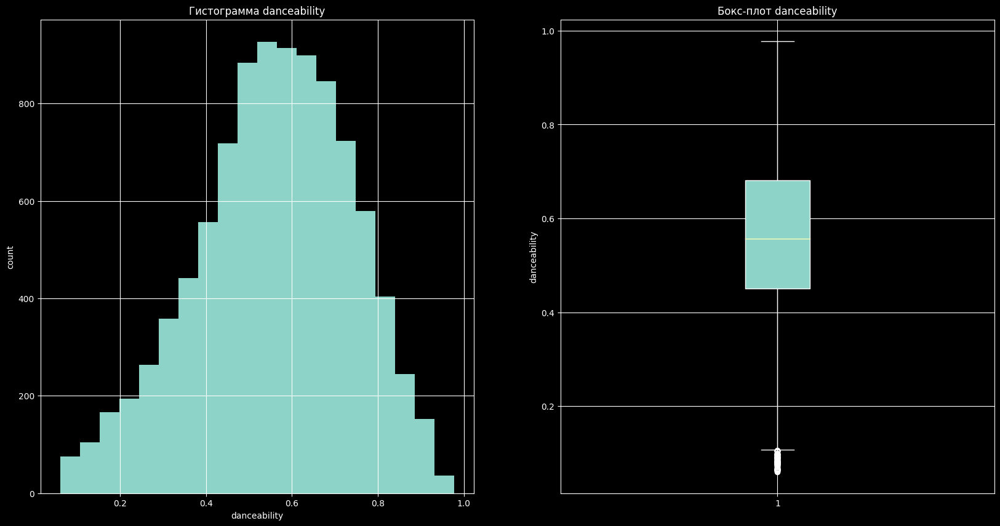

duration_ms
count    1.000000e+04
mean     2.219399e+05
std      1.248459e+05
min     -1.000000e+00
25%      1.748465e+05
50%      2.203620e+05
75%      2.689475e+05
max      2.294000e+06
Name: duration_ms, dtype: float64


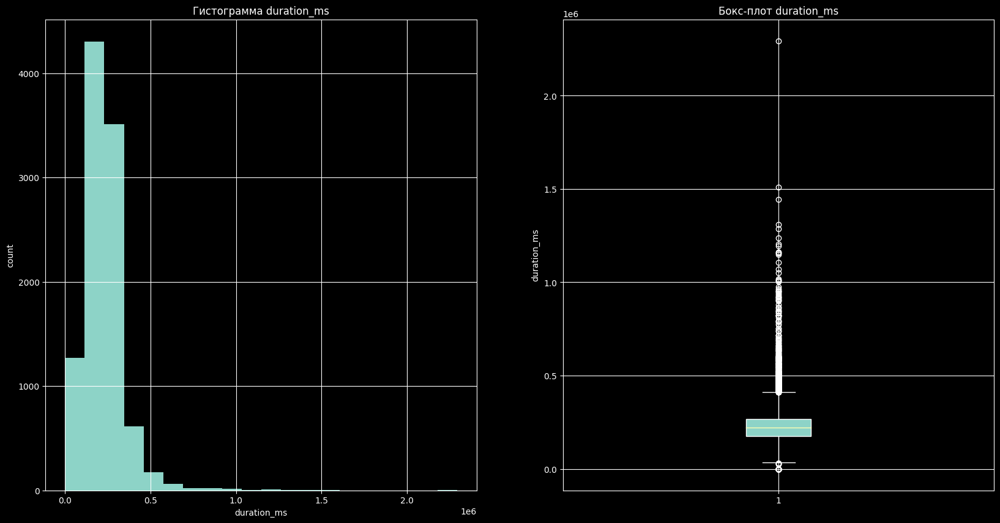

energy
count    10000.000000
mean         0.597633
std          0.264622
min          0.000943
25%          0.433000
50%          0.639000
75%          0.812000
max          0.999000
Name: energy, dtype: float64


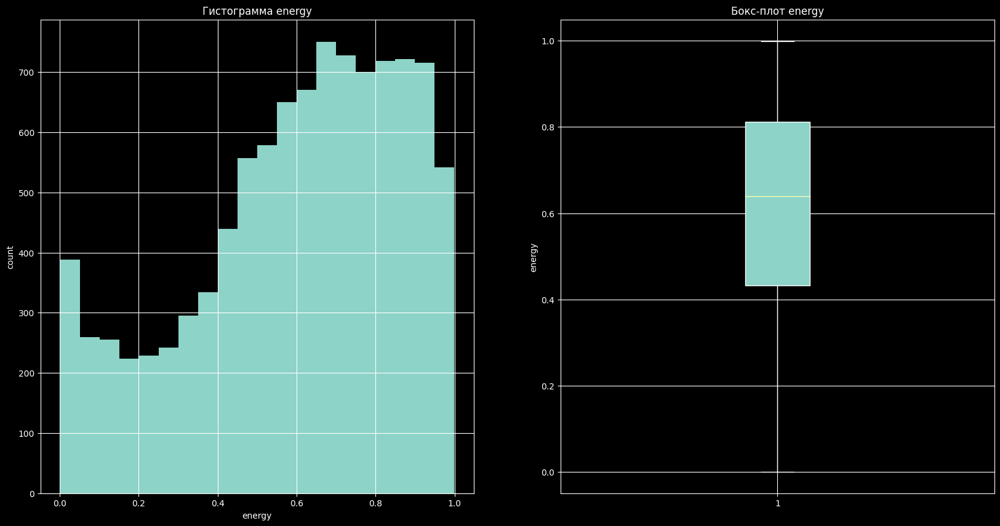

instrumentalness
count    10000.000000
mean         0.180841
std          0.325394
min          0.000000
25%          0.000000
50%          0.000191
75%          0.147250
max          0.996000
Name: instrumentalness, dtype: float64


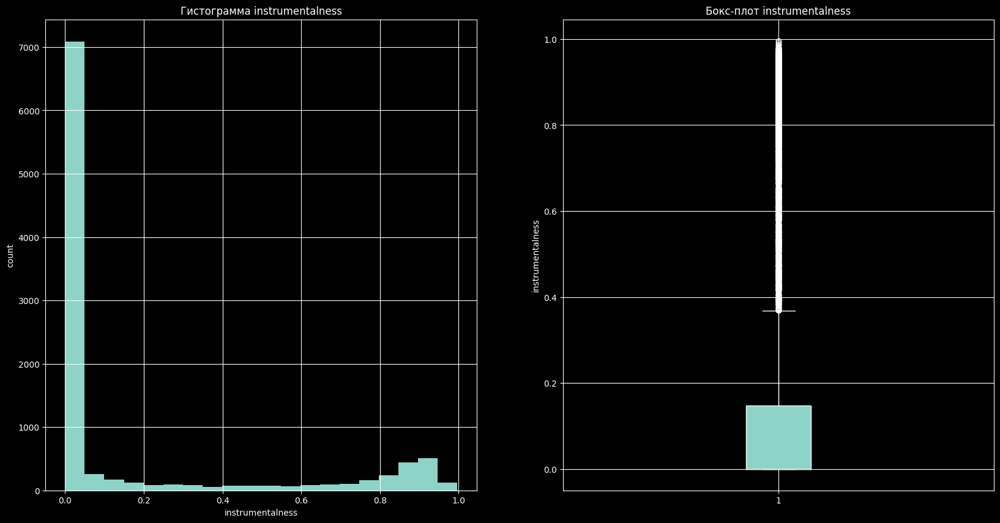

liveness
count    10000.000000
mean         0.194245
std          0.164615
min          0.013600
25%          0.096700
50%          0.125000
75%          0.245000
max          0.991000
Name: liveness, dtype: float64


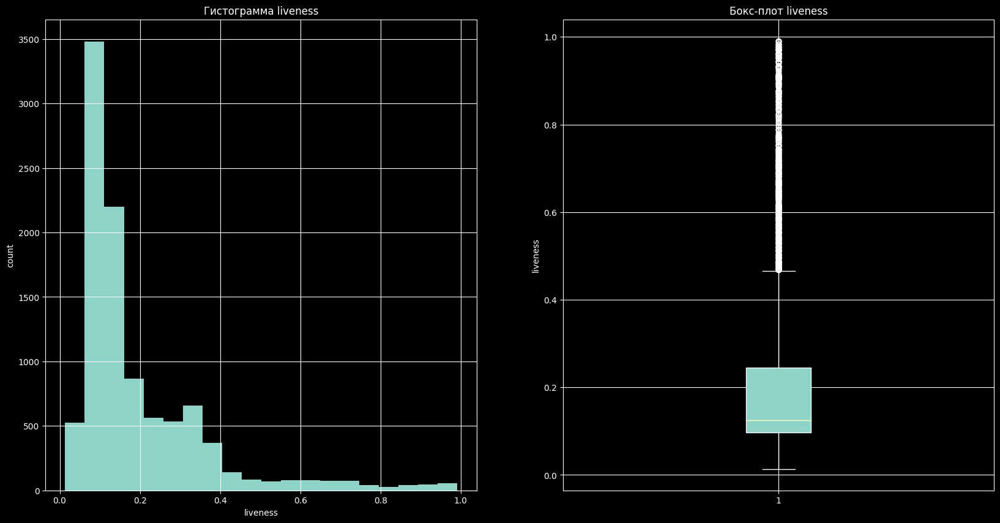

loudness
count    10000.000000
mean       -11.599550
std         14.260639
min       -104.177000
25%        -11.556000
50%         -7.480000
75%         -5.249000
max          3.744000
Name: loudness, dtype: float64


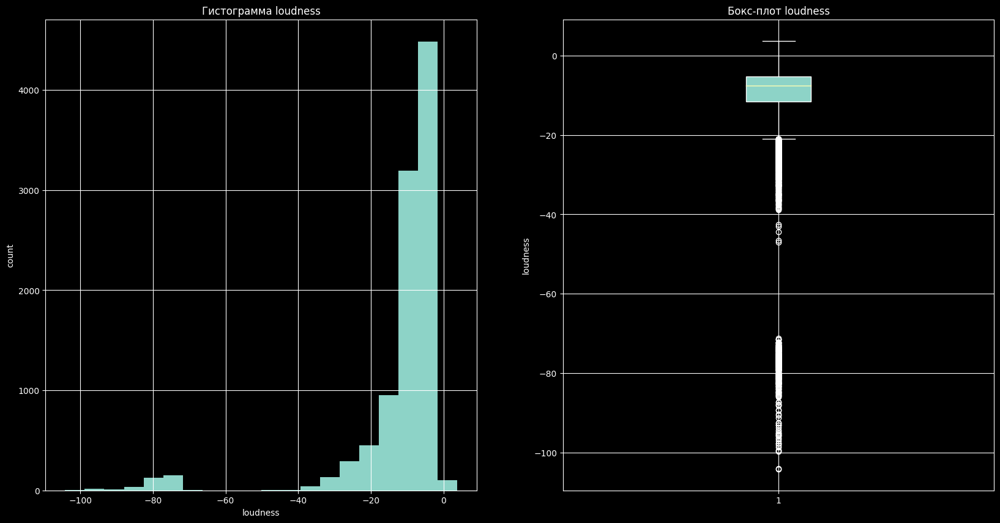

speechiness
count    10000.000000
mean         0.133931
std          0.222670
min          0.023000
25%          0.036400
50%          0.050400
75%          0.115000
max          1.792000
Name: speechiness, dtype: float64


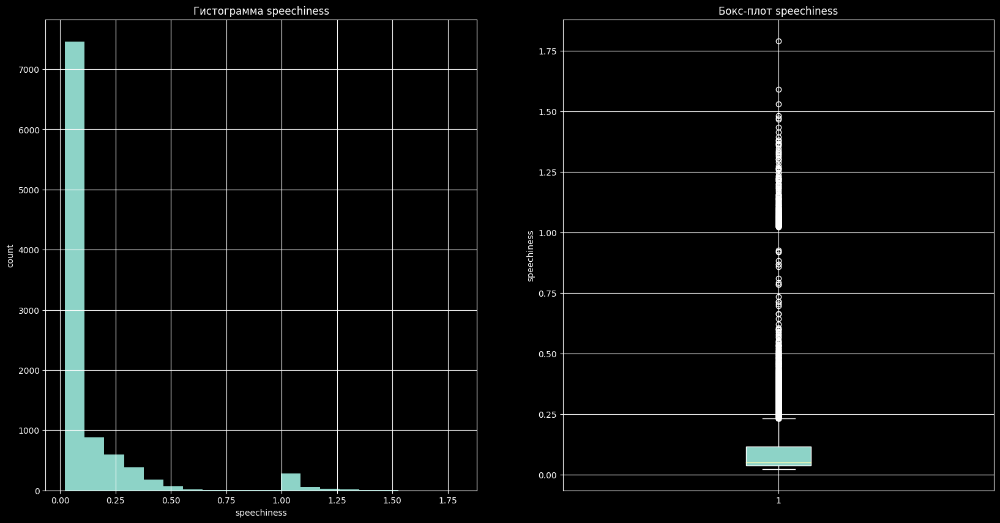

tempo
count    9016.000000
mean      120.032296
std        30.654063
min        34.347000
25%        94.999750
50%       119.919500
75%       140.618750
max       217.927000
Name: tempo, dtype: float64


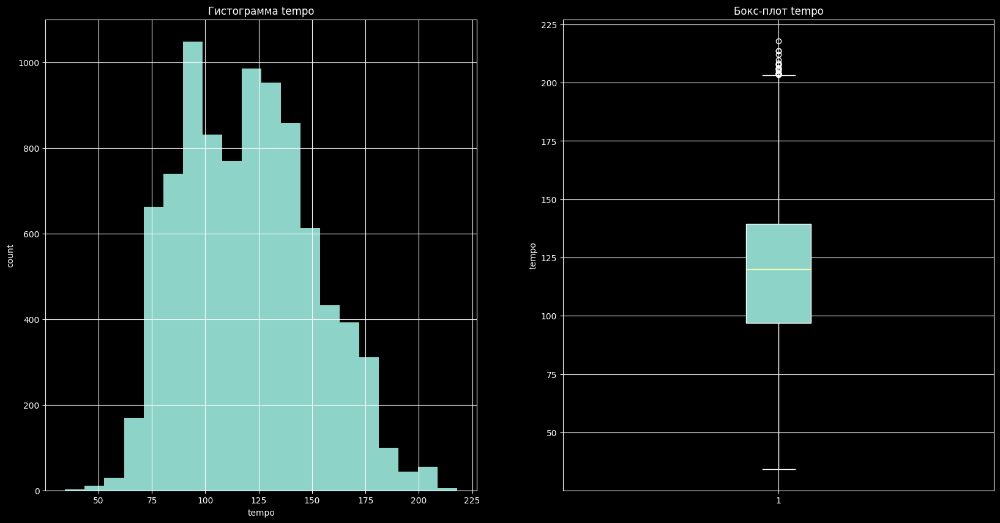

valence
count    10000.000000
mean         0.452924
std          0.247085
min          0.020500
25%          0.256000
50%          0.439000
75%          0.645000
max          0.989000
Name: valence, dtype: float64


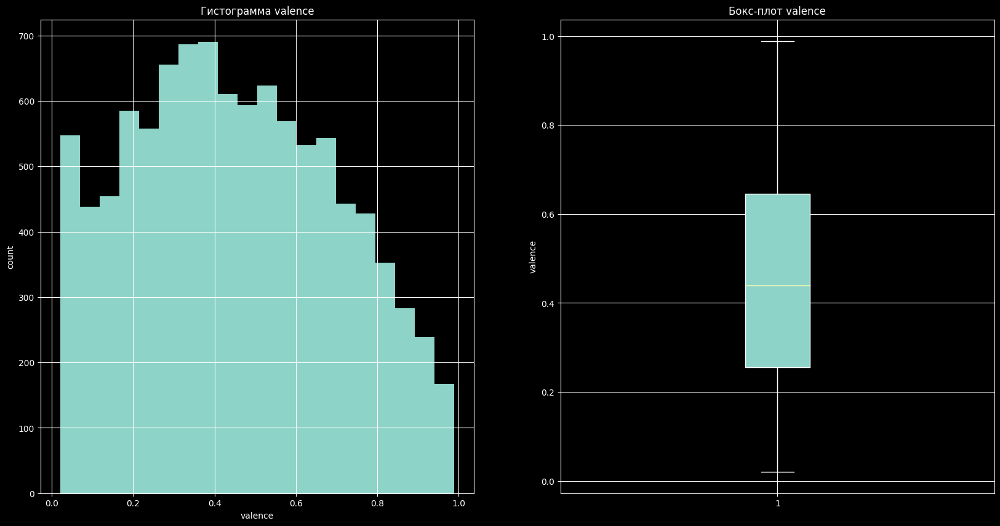

len_name
count    7326.000000
mean       20.368414
std        17.122249
min         1.000000
25%        10.000000
50%        15.000000
75%        25.000000
max       186.000000
Name: len_name, dtype: float64


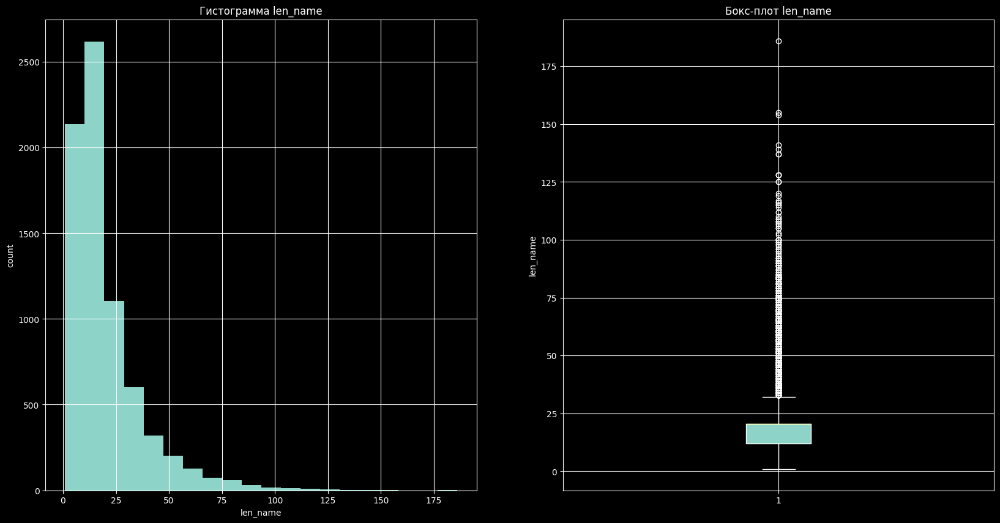

In [ ]:
for colum in ['popularity', 'acousticness', 'danceability', 'duration_ms',
              'energy', 'instrumentalness', 'liveness', 'loudness', 'speechiness',
              'tempo', 'valence', 'len_name']:
    print(colum)
    print(X_test[colum].describe())
    fig, ax = plt.subplots(nrows=1, ncols=2, figsize=(20, 10))

    ax[0].hist(X_test[colum], bins=20)
    ax[0].set_title('Гистограмма ' + colum)
    ax[0].set_xlabel(colum)
    ax[0].set_ylabel('count')
    ax[0].grid(True)

    if X_test[colum].isna().sum() != 0:
        ax[1].boxplot(X_test[colum].fillna(X_test[colum].mean()), patch_artist=True)

    else:
        ax[1].boxplot(X_test[colum], patch_artist=True)

    ax[1].set_ylabel(colum)
    ax[1].set_title('Бокс-плот ' + colum)
    ax[1].grid(True)
    plt.show()

-**'popularity'**(Популярность трека) напоминает нормальное распределение ---разброс варьируется от 0 до 96, в среднем 44

Присутсвуют слегка выбивающиеся значения по обе стороны распределения

-**'acousticness'**(Мера уверенности) напоминает распределение Пуасона со 'скосом' к левому краю разброс варьируется от 0 до 1, в среднем 0.3

Аномальных значений не наблюдаем

-**'danceability'**(Танцевальность) напоминает нормальное распределение разброс варьируется от 0.06 до 0.98, в среднем 0.55

Значения находящиеся в левой части распределения слегка выбиваются из общей массы

-**'duration_ms'**(Продолжительность трека в миллисекундах) напоминает распределение Пуасона смещенное к левому краю разброс варьируется от -1 до 2294000, в среднем 219000

Есть аномальные значения по правому краю распределения

-**'energy'**(Энергия) напоминает нормальное распределение смещенное к правому краю разброс варьируется от 0 до 0.99, в среднем 0.59

Аномальных значений не наблюдаем

-**'instrumentalness'**(содержит ли трек вокал)  напоминает распределение Пуасона смещенное к левому краю разброс варьируется от 0 до 0.99, в среднем 0.18

Есть аномальные значения по правому краю распределения

-**'liveness'**(присутствие аудитории в записи)  напоминает распределение Пуасона смещенное к левому краю разброс варьируется от 0.13 до 0.99, в среднем 0.19

Есть аномальные значения по правому краю распределения

-**'loudness'**(Общая громкость трека в децибелах)  напоминает распределение Пуасона смещенное к правому краю разброс варьируется от -104 до 3.74, в среднем -11

Есть аномальные значения по левому краю распределения

-**'speechiness'**(Речевой характер)  напоминает распределение Пуасона смещенное к левому краю разброс варьируется от 0.02 до 1.79, в среднем 0.13

Есть аномальные значения по правому краю распределения

-**'tempo'**(Темп трека в ударах в минуту) напоминает нормальное распределение разброс варьируется от 34 до 220, в среднем 120

Значения находящиеся в правой части распределения слегка выбиваются из общей массы

-**'valence'**(музыкальный позитив) напоминает нормальное распределение разброс варьируется от 0 до 0.99, в среднем 0.45

Аномальных значений не наблюдаем

-**'len_name'**(длина названия трека) напоминает распределение Пуасона смещенное к левому краю разброс варьируется от 1 до 242, в среднем 20

Есть аномальные значения по правому краю распределения

### Корреляционный анализ (train)

Построим "хитмап" по матрице корреляций Фик, посмотрим на связь признаков с целевой переменной и для отслеживания мультиколлинеарности

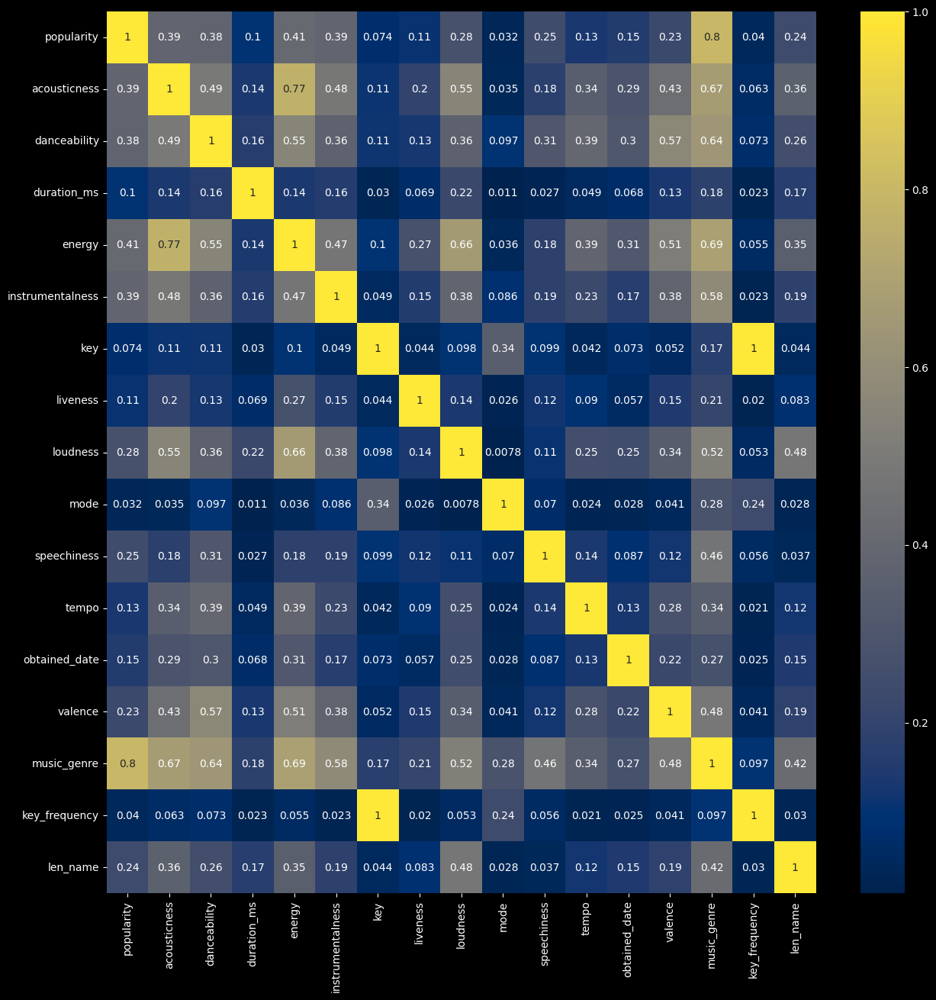

In [ ]:
fig, ax = plt.subplots(figsize=(15, 15))
sns.heatmap(df_ganre_train.drop(['instance_id', 'track_name'], axis=1
                                ).phik_matrix(
                                    interval_cols = ['popularity','acousticness',
                                                     'danceability', 'duration_ms',
                                                     'energy', 'instrumentalness', 'liveness',
                                                     'loudness', 'speechiness', 'tempo', 'valence',
                                                     'len_name', 'key_frequency']
                                    ),annot=True, cmap='cividis').legend = False

Мультиколлинеарности в данных не прослеживается, за исключением связи между key и key_frequency, key в обучении использовапть не будем

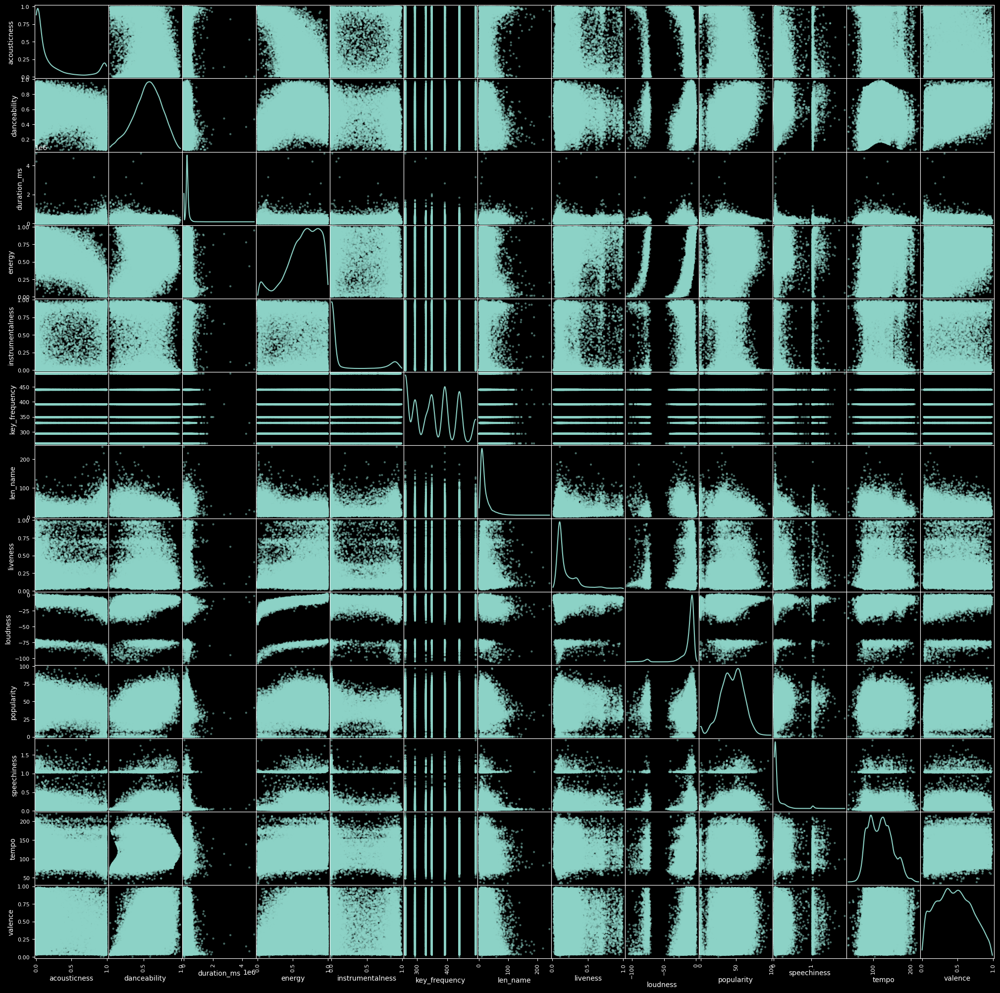

In [ ]:
corr_multi = df_ganre_train.pivot_table(index='instance_id', values=df_ganre_train.columns[1:], aggfunc='mean')
sm = pd.plotting.scatter_matrix(corr_multi, figsize=(25, 25), diagonal='kde')

plt.show()

### Корреляционный анализ (test)

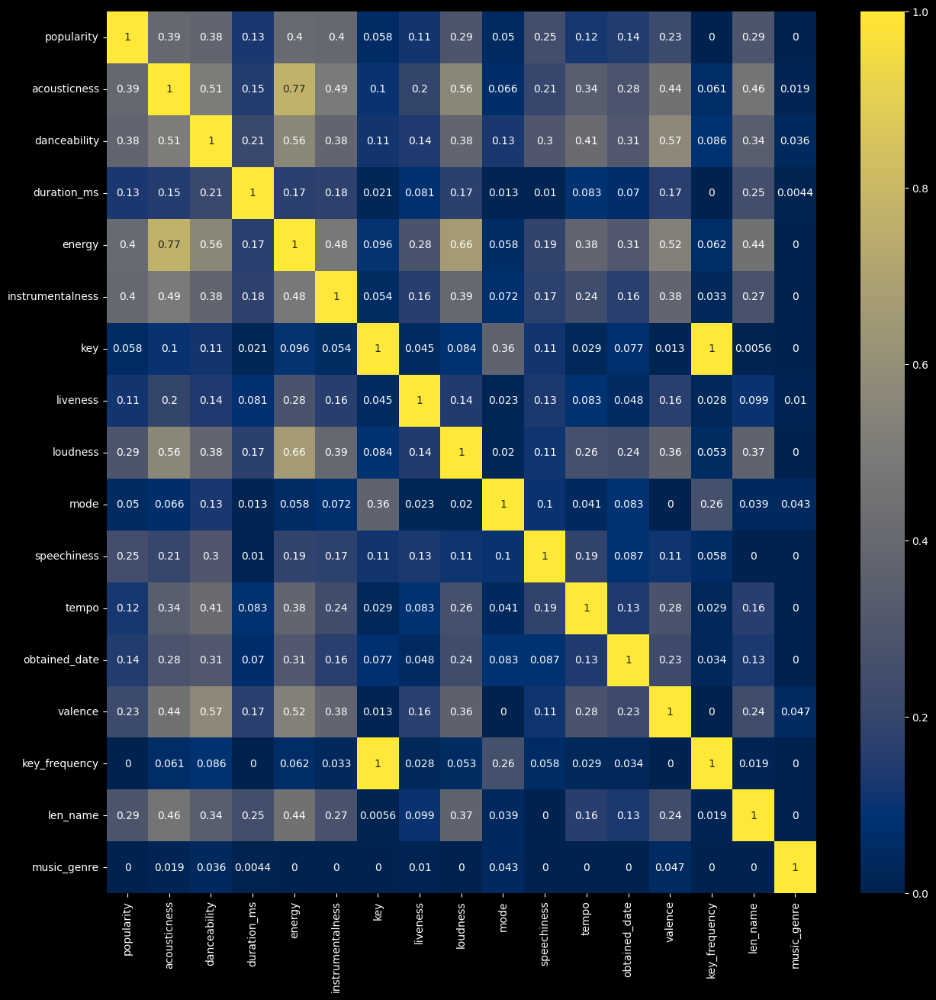

In [ ]:
fig, ax = plt.subplots(figsize=(15, 15))
sns.heatmap(pd.concat([X_test, y_test['music_genre']], axis=1).drop(['instance_id', 'track_name'], axis=1
                                ).phik_matrix(
                                    interval_cols = ['popularity','acousticness',
                                                     'danceability', 'duration_ms',
                                                     'energy', 'instrumentalness', 'liveness',
                                                     'loudness', 'speechiness', 'tempo', 'valence',
                                                     'len_name', 'key_frequency']
                                    ),annot=True, cmap='cividis').legend = False

Мультиколлинеарности в данных не прослеживается, наблюдаем значительное уменьшение связи между признаками и таргетом

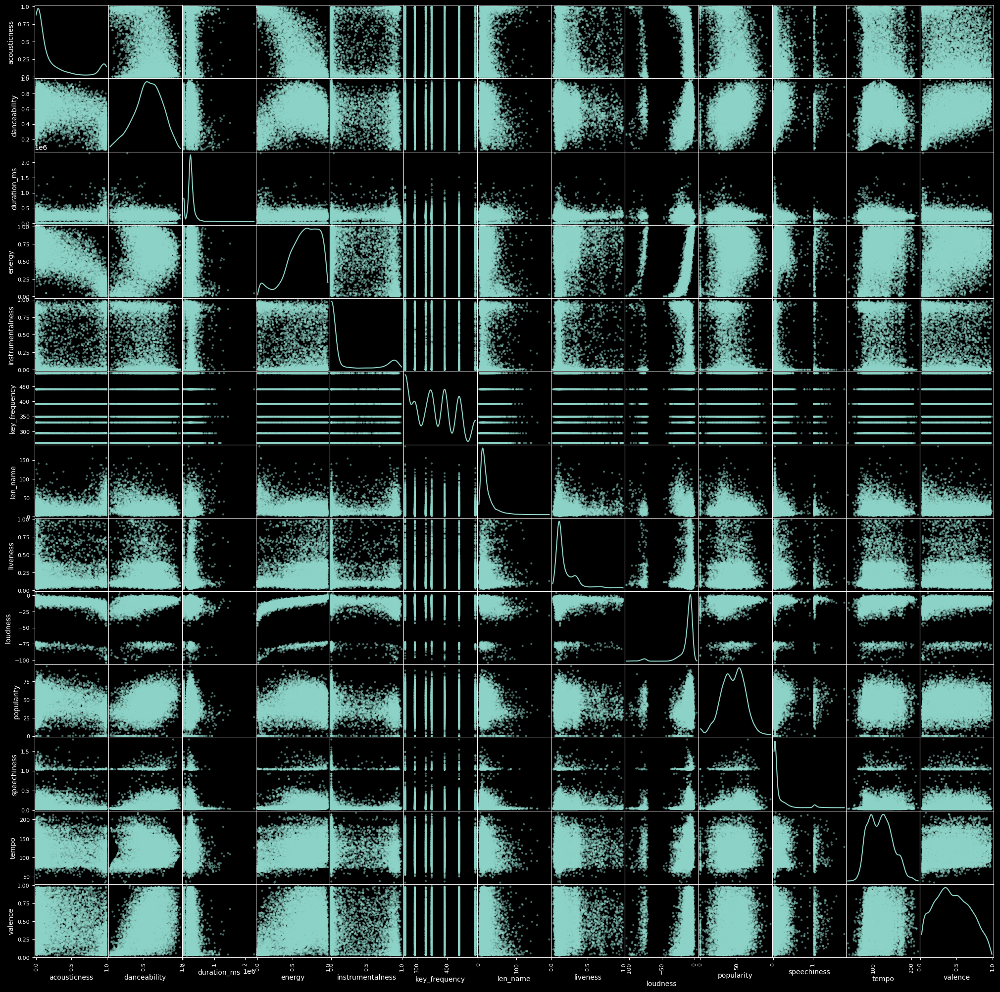

In [ ]:
corr_multi = X_test.pivot_table(index='instance_id', values=X_test.columns[1:], aggfunc='mean')
sm = pd.plotting.scatter_matrix(corr_multi, figsize=(25, 25), diagonal='kde')

plt.show()

### Подготовка данных

Выделим 'Фичи' из тренировочных данных

In [ ]:
X_train = df_ganre_train.drop(['instance_id', 'track_name', 'key', 'music_genre'], axis=1)
X_train.head()

,popularity,acousticness,danceability,duration_ms,energy,instrumentalness,liveness,loudness,mode,speechiness,tempo,obtained_date,valence,key_frequency,len_name
0,38.0,0.0455,NaN,152427.0,0.636,0.020200,0.111,-9.109,Minor,0.0591,167.357,4-Apr,0.597,349.23,NaN
1,67.0,0.0542,0.779,-1.0,0.455,0.000000,0.177,-15.025,Major,0.2800,140.181,4-Apr,0.197,261.63,15.0
2,37.0,0.5830,0.660,311008.0,0.650,0.056200,0.398,-7.738,Minor,0.0288,NaN,NaN,0.692,293.66,11.0
3,69.0,0.0122,0.680,200000.0,0.597,0.000599,0.114,-7.198,Minor,0.0304,120.052,4-Apr,0.300,329.63,NaN
4,64.0,0.9790,0.571,307698.0,0.172,0.275000,0.124,-20.700,Major,0.0318,90.972,4-Apr,0.297,392.00,24.0


In [ ]:
X_train.duplicated().sum()


270

Наблюдаем появление дублекатов после отсеивания признаков не учавствующих в обучении и таргета

In [ ]:
df_train_ = df_ganre_train.drop(['instance_id', 'track_name', 'key'], axis=1)
df_train_.head()

,popularity,acousticness,danceability,duration_ms,energy,instrumentalness,liveness,loudness,mode,speechiness,tempo,obtained_date,valence,music_genre,key_frequency,len_name
0,38.0,0.0455,NaN,152427.0,0.636,0.020200,0.111,-9.109,Minor,0.0591,167.357,4-Apr,0.597,Country,349.23,NaN
1,67.0,0.0542,0.779,-1.0,0.455,0.000000,0.177,-15.025,Major,0.2800,140.181,4-Apr,0.197,Rap,261.63,15.0
2,37.0,0.5830,0.660,311008.0,0.650,0.056200,0.398,-7.738,Minor,0.0288,NaN,NaN,0.692,Jazz,293.66,11.0
3,69.0,0.0122,0.680,200000.0,0.597,0.000599,0.114,-7.198,Minor,0.0304,120.052,4-Apr,0.300,Hip-Hop,329.63,NaN
4,64.0,0.9790,0.571,307698.0,0.172,0.275000,0.124,-20.700,Major,0.0318,90.972,4-Apr,0.297,Rock,392.00,24.0


In [ ]:
df_train_.duplicated().sum()

0

При оставлении таргета в данных учавствующих в обучении явных дубликатов мы не наблюдаем, то есть у нас есть 345 наблюдений с одинаковыми значениями признаков но с разным значением таргета. Оставим их

Сохраняем таргет:

In [ ]:
y_train = df_ganre_train['music_genre']
y_train.head()

0    Country
1        Rap
2       Jazz
3    Hip-Hop
4       Rock
Name: music_genre, dtype: object

In [ ]:
y_test

,instance_id,music_genre
0,32911,Rap
1,30681,Country
2,9640,Classical
3,40204,Anime
4,11034,Country
...,...,...
9995,39792,Jazz
9996,35928,Blues
9997,16758,Country
9998,18788,Classical


In [ ]:
X_test

,instance_id,track_name,popularity,acousticness,danceability,duration_ms,energy,instrumentalness,key,liveness,loudness,mode,speechiness,tempo,obtained_date,valence,key_frequency,len_name
0,32911,Pretty Green,30.0,0.093100,0.429,249640.0,0.862,0.000001,D,0.1610,-5.696,Major,0.0760,177.023,NaN,0.335,293.66,12.0
1,30681,Son Of The Sun,45.0,0.071200,0.507,190253.0,0.754,0.000045,A,0.3180,-6.921,Major,0.0324,NaN,4-Apr,0.582,440.00,14.0
2,9640,NaN,59.0,0.004130,0.559,276707.0,0.912,0.000000,F,0.0567,-6.799,Major,0.0608,103.130,4-Apr,0.653,349.23,NaN
3,40204,How I Could Just Kill a Man,61.0,0.001140,0.598,244693.0,0.939,0.000009,G,0.2880,-3.663,Major,0.1050,95.884,4-Apr,0.630,392.00,27.0
4,11034,Handsome And Wealthy,62.0,0.003480,0.858,210557.0,0.665,0.000000,NaN,0.0940,-2.907,Major,0.1010,146.031,4-Apr,0.237,NaN,20.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9995,39792,Drifter,39.0,0.012600,0.771,453497.0,0.543,0.843000,F,0.0895,-10.261,Minor,0.0331,122.019,4-Apr,0.391,349.23,7.0
9996,35928,Build Your Kingdom Here,53.0,0.021800,0.456,257960.0,0.508,0.000000,D,0.2370,-14.339,Major,0.0402,133.965,4-Apr,0.553,293.66,23.0
9997,16758,Kicking and Screaming,30.0,0.000658,0.546,215957.0,0.847,0.867000,G,0.0848,-6.927,Major,0.0524,94.997,4-Apr,0.557,392.00,21.0
9998,18788,Raphtalia,NaN,0.982000,0.318,94613.0,0.201,0.962000,G,0.1040,-16.899,Major,0.0670,165.866,4-Apr,0.334,392.00,9.0


Для удобства сохраняю все тестовые данные в отдельный фрейм

In [ ]:
df_ganre_test = pd.concat([X_test, y_test['music_genre']], axis=1)
df_ganre_test.head()

,instance_id,track_name,popularity,acousticness,danceability,duration_ms,energy,instrumentalness,key,liveness,loudness,mode,speechiness,tempo,obtained_date,valence,key_frequency,len_name,music_genre
0,32911,Pretty Green,30.0,0.09310,0.429,249640.0,0.862,0.000001,D,0.1610,-5.696,Major,0.0760,177.023,NaN,0.335,293.66,12.0,Rap
1,30681,Son Of The Sun,45.0,0.07120,0.507,190253.0,0.754,0.000045,A,0.3180,-6.921,Major,0.0324,NaN,4-Apr,0.582,440.00,14.0,Country
2,9640,NaN,59.0,0.00413,0.559,276707.0,0.912,0.000000,F,0.0567,-6.799,Major,0.0608,103.130,4-Apr,0.653,349.23,NaN,Classical
3,40204,How I Could Just Kill a Man,61.0,0.00114,0.598,244693.0,0.939,0.000009,G,0.2880,-3.663,Major,0.1050,95.884,4-Apr,0.630,392.00,27.0,Anime
4,11034,Handsome And Wealthy,62.0,0.00348,0.858,210557.0,0.665,0.000000,NaN,0.0940,-2.907,Major,0.1010,146.031,4-Apr,0.237,NaN,20.0,Country


Кодируем целевой признак

In [ ]:
label_encoder = LabelEncoder()
label_encoder.fit(y_train)
y_train_label = label_encoder.fit_transform(y_train)
pd.Series(y_train_label).unique()

array([4, 8, 7, 6, 9, 0, 3, 5, 1, 2])

In [ ]:
y_test_label = label_encoder.transform(y_test['music_genre'])
pd.Series(y_test_label).unique()

array([8, 4, 3, 1, 9, 2, 5, 6, 0, 7])

In [ ]:
df_ganre_train.groupby('music_genre')['instance_id'].count()

music_genre
Alternative    4059
Anime          4017
Blues          3987
Classical      3980
Country        3985
Electronic     4020
Hip-Hop        3957
Jazz           4055
Rap            3980
Rock           3960
Name: instance_id, dtype: int64

Наблюдаем что данные хорошо сбалансированны по целевому признаку, нет надобности работать с дисбалансом классов

Сохраним названия колонок для предобработки

In [ ]:
ohe_columns = ['mode', 'obtained_date']
ord_columns = []
num_columns = ['popularity', 'acousticness', 'danceability',
               'duration_ms', 'energy', 'instrumentalness', 'liveness',
               'loudness', 'speechiness', 'tempo', 'valence', 'key_frequency', 'len_name']

Начинаем создавать пайплайн, для разных типов данных свой пайплайн с предобработкой

In [ ]:
ohe_pipe = Pipeline(
    [('simpleImputer_ohe', SimpleImputer(missing_values=np.nan, strategy='most_frequent')),
     ('ohe', OneHotEncoder(drop='first', handle_unknown='ignore', sparse=False))
    ]
    )

In [ ]:
ord_pipe = Pipeline(
    [('simpleImputer_before_ord', SimpleImputer(missing_values=np.nan, strategy='most_frequent')),
     ('ord',  OrdinalEncoder(
                categories=[
                ],
                handle_unknown='use_encoded_value', unknown_value=np.nan
            )
        ),
     ('simpleImputer_after_ord', SimpleImputer(missing_values=np.nan, strategy='most_frequent'))
    ]
)

In [ ]:
num_pipe = Pipeline(
    [('knnimputer_num', KNNImputer(n_neighbors=2, weights="uniform")),
     ('num', StandardScaler())
    ]
    )

Собираем все пайплайны в один пайплайн предобработки и указываем к каким колонкам их применить

In [ ]:
data_preprocessor = ColumnTransformer(
    [('ohe', ohe_pipe, ohe_columns),
     ('ord', ord_pipe, ord_columns),
     ('num', num_pipe, num_columns)
    ],
    remainder='passthrough'
)

Завершаем создание пайплайна с указанием модели в конце

In [ ]:
pipe_final = Pipeline([
    ('preprocessor', data_preprocessor),
    ('models', LogisticRegression(random_state=42))
])

pipe_final

Pipeline(steps=[('preprocessor',
                 ColumnTransformer(remainder='passthrough',
                                   transformers=[('ohe',
                                                  Pipeline(steps=[('simpleImputer_ohe',
                                                                   SimpleImputer(strategy='most_frequent')),
                                                                  ('ohe',
                                                                   OneHotEncoder(drop='first',
                                                                                 handle_unknown='ignore',
                                                                                 sparse=False))]),
                                                  ['mode', 'obtained_date']),
                                                 ('ord',
                                                  Pipeline(steps=[('simpleImputer_before_ord',
                                                                   SimpleImputer(strategy='m...
                                                                   SimpleImputer(strategy='most_frequent'))]),
                                                  []),
                                                 ('num',
                                                  Pipeline(steps=[('knnimputer_num',
                                                                   KNNImputer(n_neighbors=2)),
                                                                  ('num',
                                                                   StandardScaler())]),
                                                  ['popularity', 'acousticness',
                                                   'danceability',
                                                   'duration_ms', 'energy',
                                                   'instrumentalness',
                                                   'liveness', 'loudness',
                                                   'speechiness', 'tempo',
                                                   'valence', 'key_frequency',
                                                   'len_name'])])),
                ('models', LogisticRegression(random_state=42))])

Применяю зарание импутер для заполнения пропусков в кол-ых переменных, чтобы облегчить работу search на следующем этапе работы

In [ ]:
KNNImp = KNNImputer(n_neighbors=2, weights="uniform")
X_train[num_columns] = KNNImp.fit_transform(X_train[num_columns])

### Обучение моделей

Задаем параметры для кросс-валидации и перебора моделей с гиперпараметрами

In [ ]:
param_grid = [
    # словарь для модели DecisionTreeClassifier()
    {
        'models': [DecisionTreeClassifier(random_state=42)],
        'models__max_depth': range(2, 31, 2),
        'models__max_features': range(2, 13, 2),
        'preprocessor__num__num': [StandardScaler(), MinMaxScaler(), 'passthrough']
    },

    # словарь для модели KNeighborsClassifier()
    {
        'models': [KNeighborsClassifier()],
        'models__n_neighbors': range(1, 200, 5),
        'models__metric': ['euclidean', 'cityblocks'],
        'preprocessor__num__num': [StandardScaler(), MinMaxScaler(), 'passthrough']
    },

    # словарь для модели LogisticRegression()
    {
        'models': [LogisticRegression(random_state=42)],
        'models__C': [0.01, 0.1, 1, 10],
        'models__penalty': ['l1', 'l2', 'elasticnet', 'None'],
        'models__solver': ['lbfgs', 'liblinear', 'newton-cg', 'newton-cholesky', 'sag', 'saga'],
        'preprocessor__num__num': [StandardScaler(), MinMaxScaler(), 'passthrough']
    }
]

In [ ]:
randomized_search = RandomizedSearchCV(
    pipe_final,
    param_grid,
    cv=3,
    n_iter=10,
    scoring='roc_auc_ovo',
    random_state=42,
    n_jobs=-1
)
randomized_search.fit(X_train, y_train_label)
print('Лучшая модель и её параметры:\n\n', randomized_search.best_estimator_)
print ('Метрика лучшей модели на кросс-валидации:', randomized_search.best_score_)

Лучшая модель и её параметры:

 Pipeline(steps=[('preprocessor',
                 ColumnTransformer(remainder='passthrough',
                                   transformers=[('ohe',
                                                  Pipeline(steps=[('simpleImputer_ohe',
                                                                   SimpleImputer(strategy='most_frequent')),
                                                                  ('ohe',
                                                                   OneHotEncoder(drop='first',
                                                                                 handle_unknown='ignore',
                                                                                 sparse=False))]),
                                                  ['mode', 'obtained_date']),
                                                 ('ord',
                                                  Pipeline(steps=[('simpleImputer_before_ord',
                 

### Работа с аномальными значениями

Применим алгоритм isolationForest для обработки аномальных значений, кол-во семплов которые алгоритм будет считать аномалиями выставим 5%

In [ ]:
isolationForest = IsolationForest(n_estimators=100, contamination=0.05, bootstrap=True, random_state=42)
isolationForest.fit(X_train[num_columns])

IsolationForest(bootstrap=True, contamination=0.05, random_state=42)

In [ ]:
pred_if = isolationForest.predict(X_train[num_columns])
X_train_if = X_train.copy()
X_train_if['pred_if'] = pd.Series(pred_if)
X_train_if = X_train_if[X_train_if['pred_if'] == 1].drop('pred_if', axis=1).reset_index(drop=True)
X_train_if

,popularity,acousticness,danceability,duration_ms,energy,instrumentalness,liveness,loudness,mode,speechiness,tempo,obtained_date,valence,key_frequency,len_name
0,38.0,0.0455,0.5240,152427.0,0.6360,0.020200,0.1110,-9.109,Minor,0.0591,167.357,4-Apr,0.597,349.23,29.0
1,67.0,0.0542,0.7790,-1.0,0.4550,0.000000,0.1770,-15.025,Major,0.2800,140.181,4-Apr,0.197,261.63,15.0
2,37.0,0.5830,0.6600,311008.0,0.6500,0.056200,0.3980,-7.738,Minor,0.0288,102.067,NaN,0.692,293.66,11.0
3,69.0,0.0122,0.6800,200000.0,0.5970,0.000599,0.1140,-7.198,Minor,0.0304,120.052,4-Apr,0.300,329.63,10.0
4,64.0,0.9790,0.5710,307698.0,0.1720,0.275000,0.1240,-20.700,Major,0.0318,90.972,4-Apr,0.297,392.00,24.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
37995,36.0,0.9290,0.3060,157994.0,0.3410,0.913000,0.1620,-16.957,Minor,0.0359,151.375,3-Apr,0.383,261.63,108.0
37996,47.0,0.8610,0.6490,335320.0,0.0969,0.452000,0.0955,-19.541,NaN,0.0434,112.038,4-Apr,0.306,261.63,9.0
37997,0.0,0.0568,0.4750,219880.0,0.9650,0.000000,0.1370,-2.877,Major,0.0462,171.882,4-Apr,0.868,261.63,11.0
37998,14.0,0.0317,0.4800,255627.0,0.9430,0.000018,0.3450,-0.764,Minor,0.2370,174.062,4-Apr,0.705,440.00,12.0


In [ ]:
y_train_label_if = y_train_label.copy()
y_train_label_if = pd.concat([pd.Series(y_train_label_if), pd.Series(pred_if)], axis=1)
y_train_label_if = y_train_label_if[y_train_label_if[1] == 1].drop(1, axis=1)
y_train_label_if = pd.Series(y_train_label_if[0]).reset_index(drop=True)
y_train_label_if

0        4
1        8
2        7
3        6
4        9
        ..
37995    3
37996    7
37997    4
37998    1
37999    6
Name: 0, Length: 38000, dtype: int64

Применяем RandomizedSearchCV к обработанным isolationForest данным

In [ ]:
randomized_search = RandomizedSearchCV(
    pipe_final,
    param_grid,
    cv=3,
    n_iter=10,
    scoring='roc_auc_ovo',
    random_state=42,
    n_jobs=-1
)
randomized_search.fit(X_train_if, y_train_label_if)
print('Лучшая модель и её параметры:\n\n', randomized_search.best_estimator_)
print ('Метрика лучшей модели на кросс-валидации:', randomized_search.best_score_)

Лучшая модель и её параметры:

 Pipeline(steps=[('preprocessor',
                 ColumnTransformer(remainder='passthrough',
                                   transformers=[('ohe',
                                                  Pipeline(steps=[('simpleImputer_ohe',
                                                                   SimpleImputer(strategy='most_frequent')),
                                                                  ('ohe',
                                                                   OneHotEncoder(drop='first',
                                                                                 handle_unknown='ignore',
                                                                                 sparse=False))]),
                                                  ['mode', 'obtained_date']),
                                                 ('ord',
                                                  Pipeline(steps=[('simpleImputer_before_ord',
                 

Наблюдаем идентичный результат целевой метрики как и до применения isolationForest

Взглянем на результат применения isolationForest

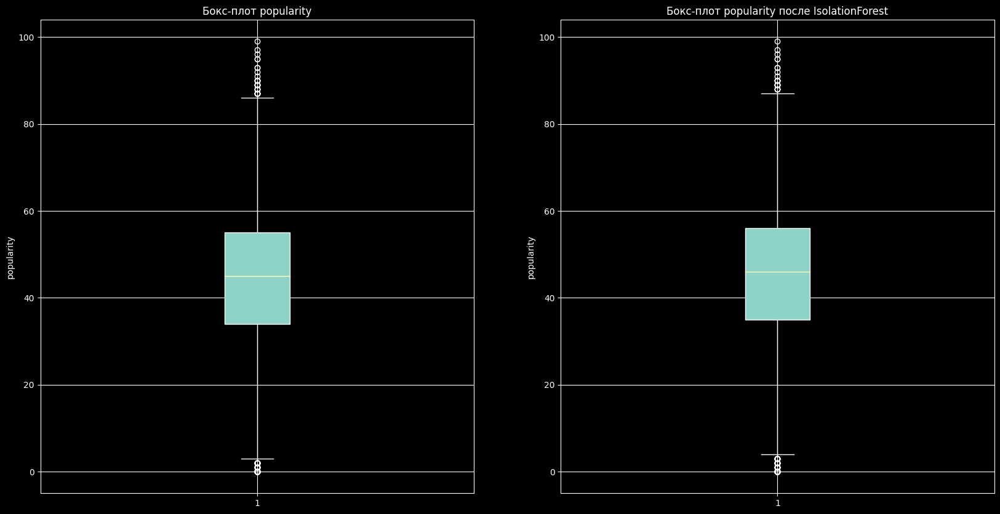

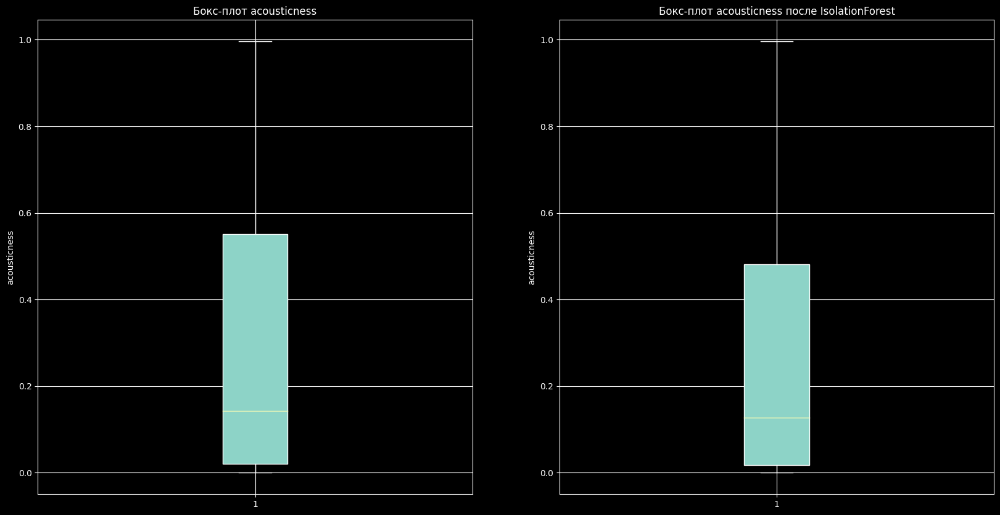

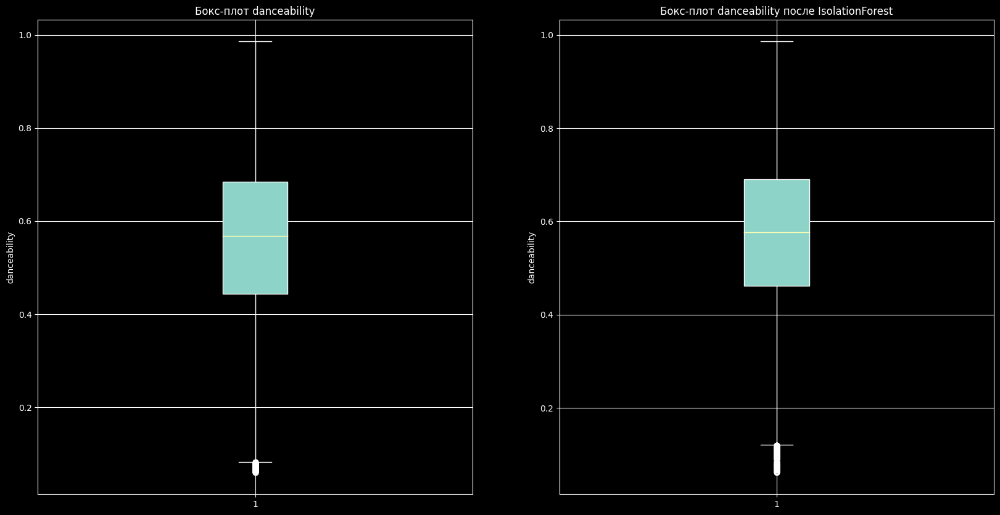

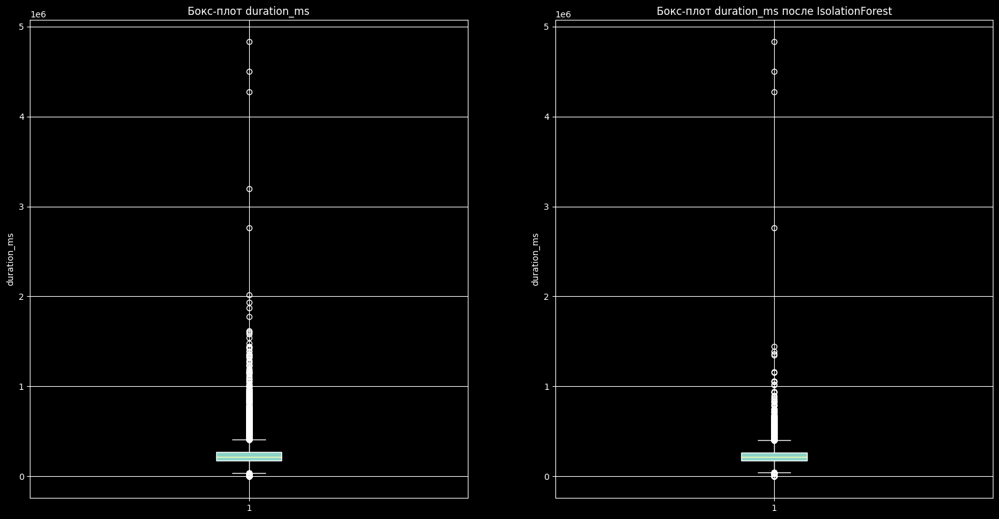

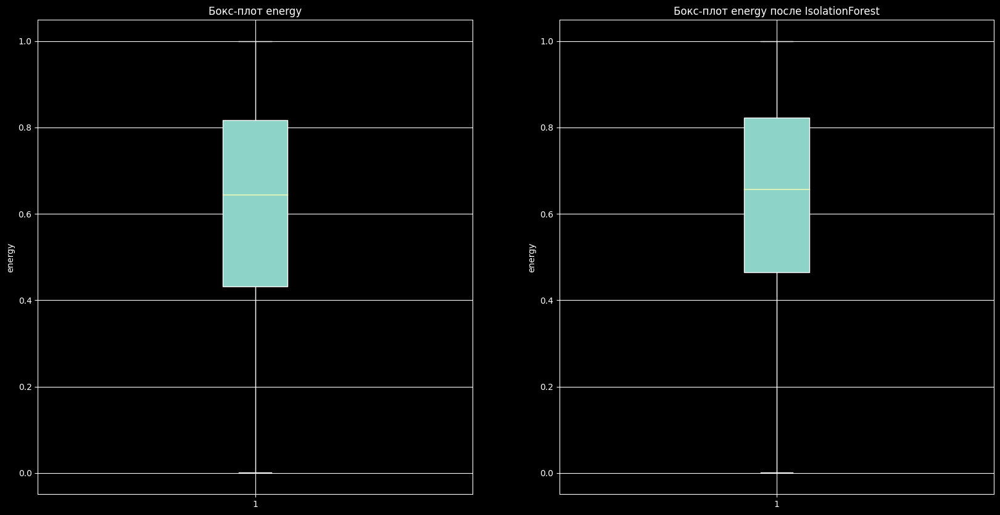

...

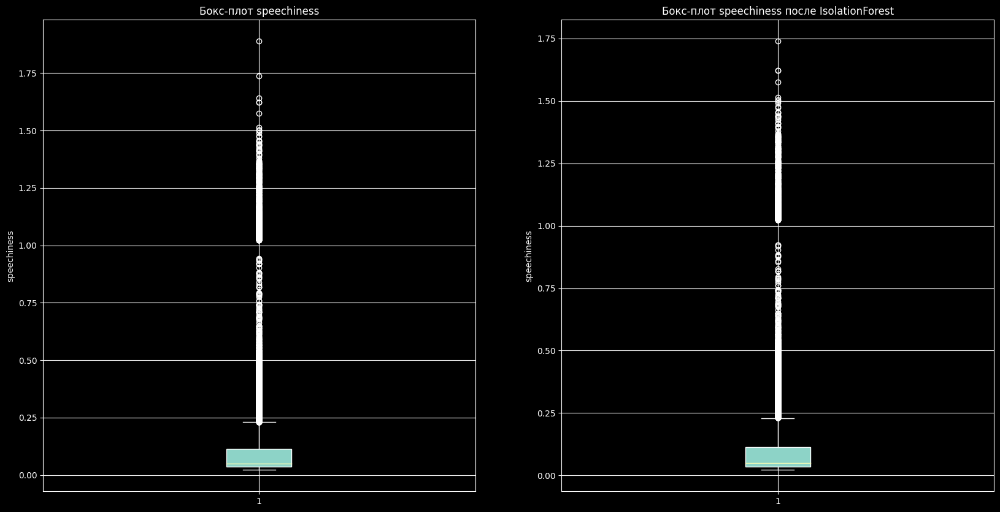

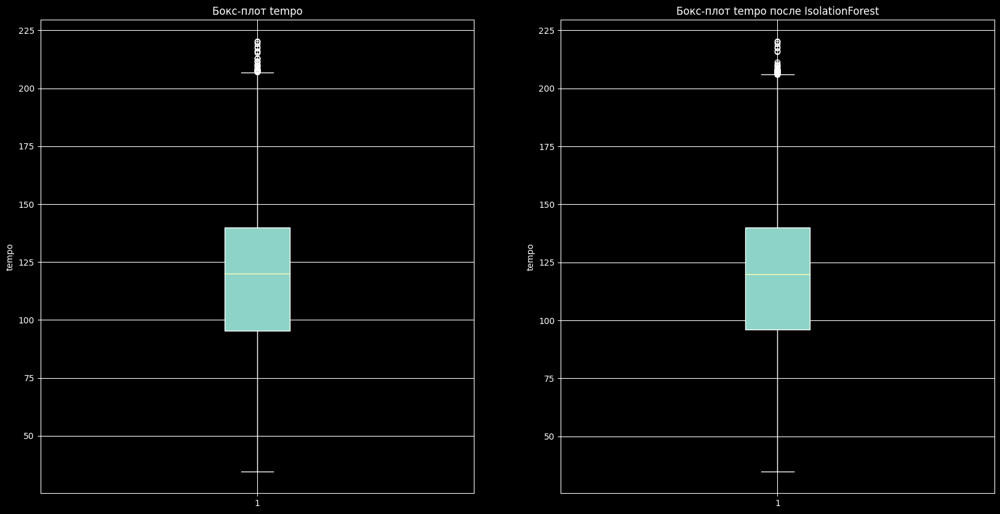

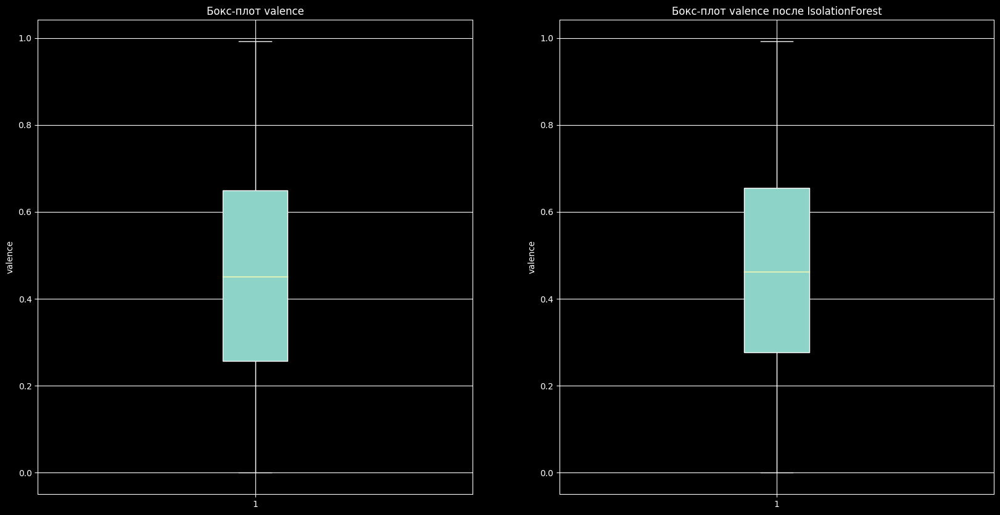

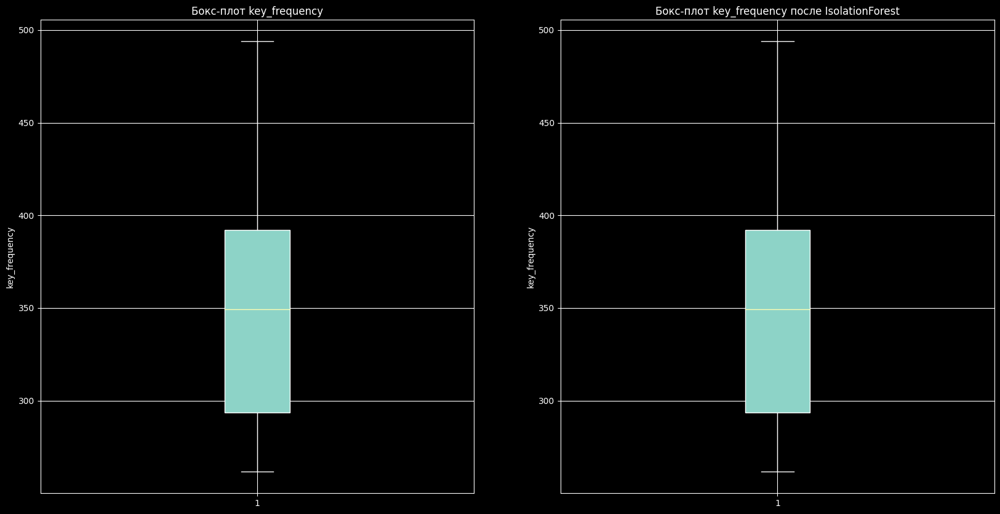

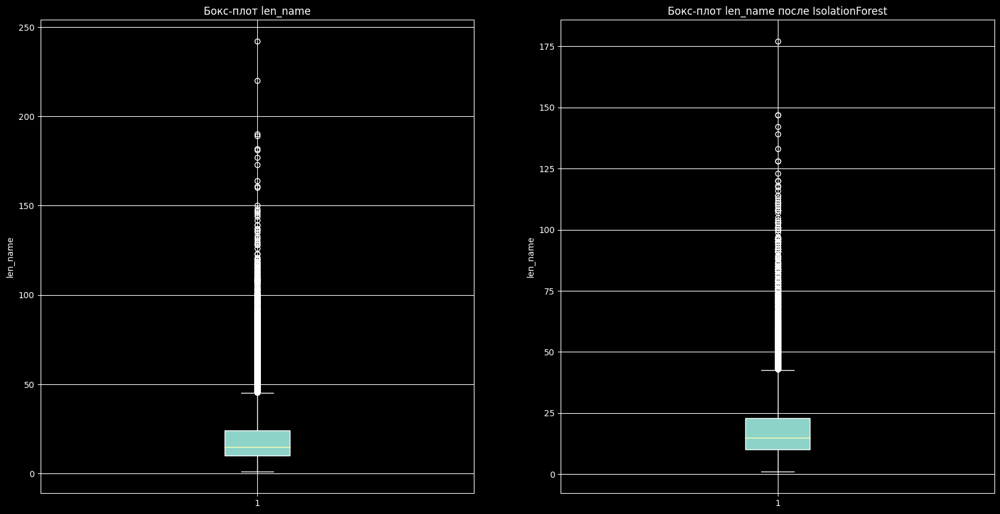

In [ ]:
for colum in num_columns:
    fig, ax = plt.subplots(nrows=1, ncols=2, figsize=(20, 10))

    ax[0].boxplot(X_train[colum], patch_artist=True)
    ax[0].set_ylabel(colum)
    ax[0].set_title('Бокс-плот ' + colum)
    ax[0].grid(True)

    ax[1].boxplot(X_train_if[colum], patch_artist=True)
    ax[1].set_ylabel(colum)
    ax[1].set_title('Бокс-плот ' + colum + ' после IsolationForest')
    ax[1].grid(True)
    plt.show()
    print()

Создадим функцию для обработки аномальных значений slice_quantile, которая приводит аномальные значения к "усам боксплота"

In [ ]:
def slice_quantile(column):
    IQR = Q3 - Q1
    max_q = Q3+1.5*IQR
    min_q = Q1-1.5*IQR
    try:
        if column < min_q:
            return min_q
        elif column > max_q:
            return max_q
        else:
            return column
    except:
        return column

In [ ]:
X_train_sq = X_train.copy()
for colum in num_columns:
  Q1 = X_train_sq[colum].quantile(0.25)
  Q3 = X_train_sq[colum].quantile(0.75)
  X_train_sq[colum] = X_train_sq[colum].apply(slice_quantile)

In [ ]:
randomized_search = RandomizedSearchCV(
    pipe_final,
    param_grid,
    cv=3,
    n_iter=10,
    scoring='roc_auc_ovo',
    random_state=42,
    n_jobs=-1
)
randomized_search.fit(X_train_sq, y_train_label)
print('Лучшая модель и её параметры:\n\n', randomized_search.best_estimator_)
print ('Метрика лучшей модели на кросс-валидации:', randomized_search.best_score_)

Лучшая модель и её параметры:

 Pipeline(steps=[('preprocessor',
                 ColumnTransformer(remainder='passthrough',
                                   transformers=[('ohe',
                                                  Pipeline(steps=[('simpleImputer_ohe',
                                                                   SimpleImputer(strategy='most_frequent')),
                                                                  ('ohe',
                                                                   OneHotEncoder(drop='first',
                                                                                 handle_unknown='ignore',
                                                                                 sparse=False))]),
                                                  ['mode', 'obtained_date']),
                                                 ('ord',
                                                  Pipeline(steps=[('simpleImputer_before_ord',
                 

Незначительная прибавка по целевой метрики на уровне погрешности

Взглянем на результаты работы функции slice_quantile

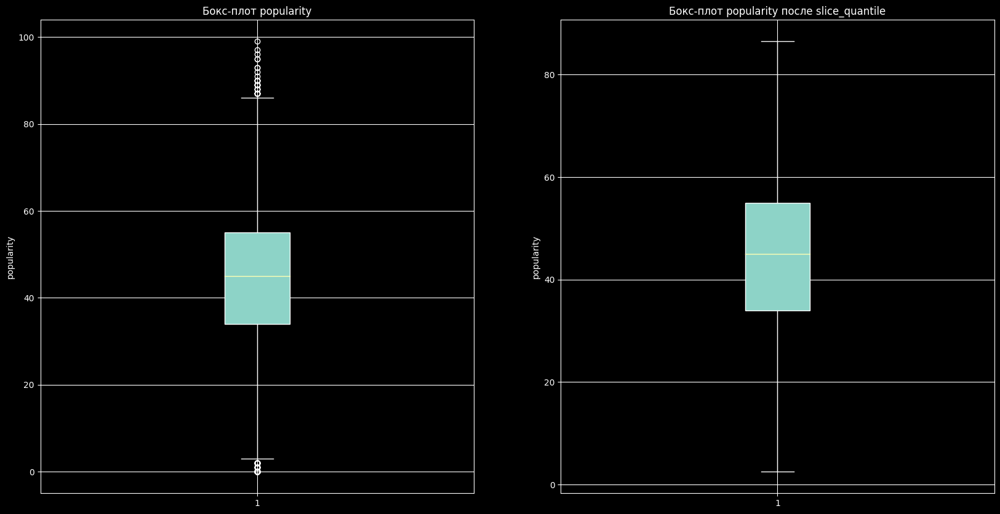

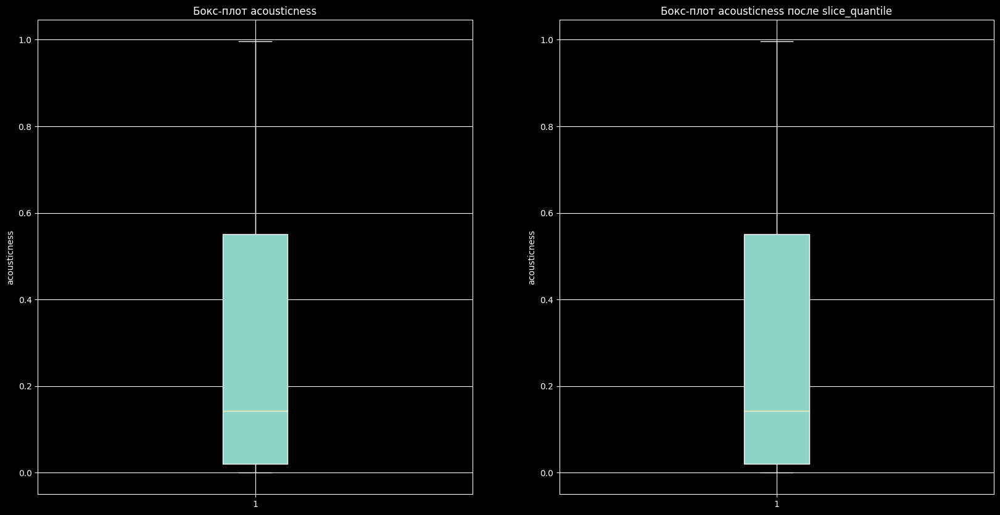

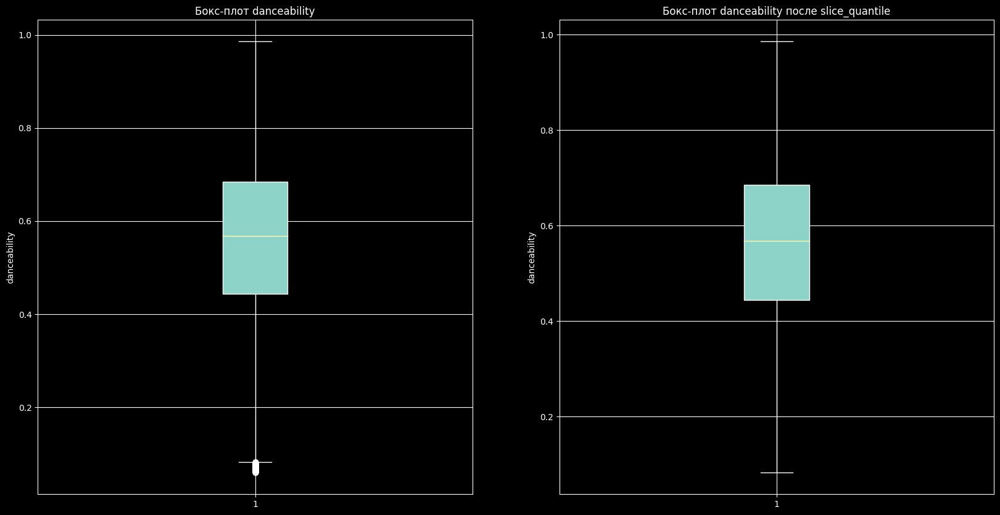

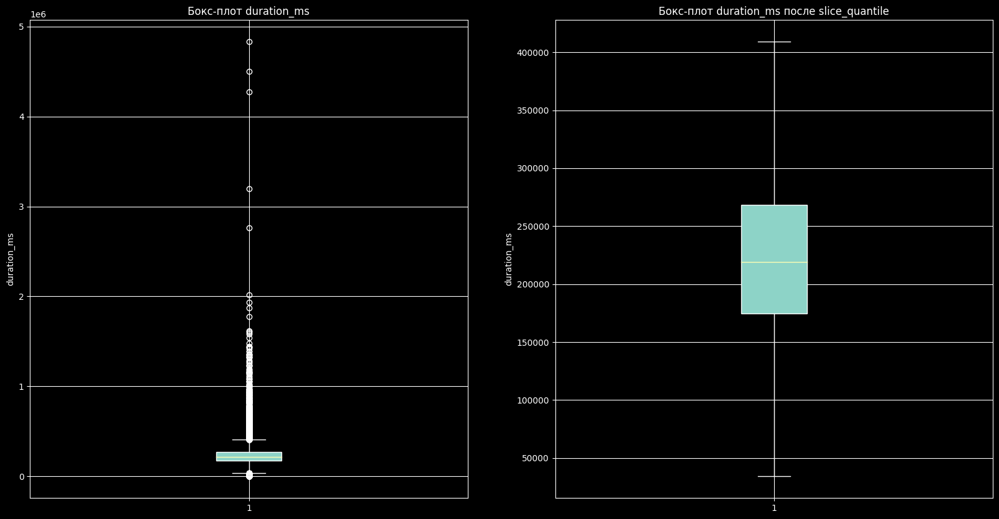

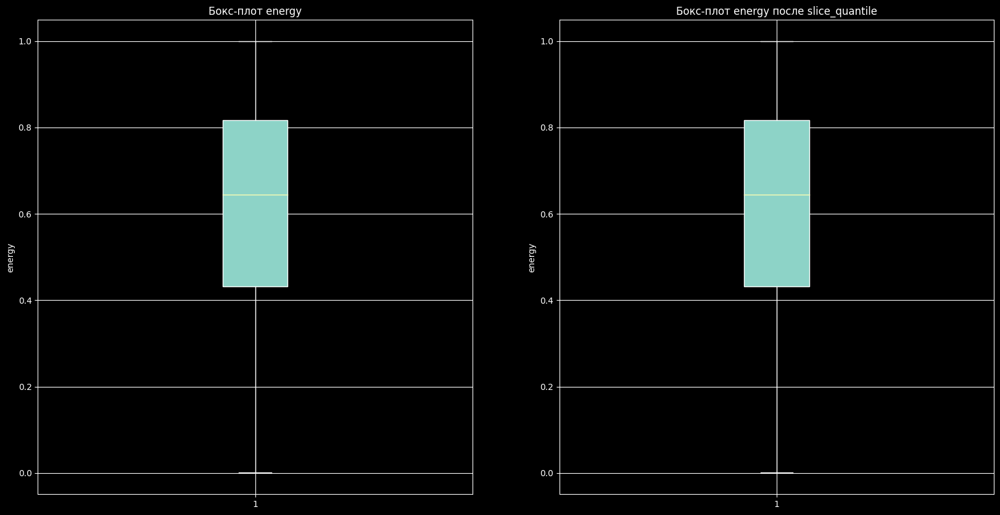

...

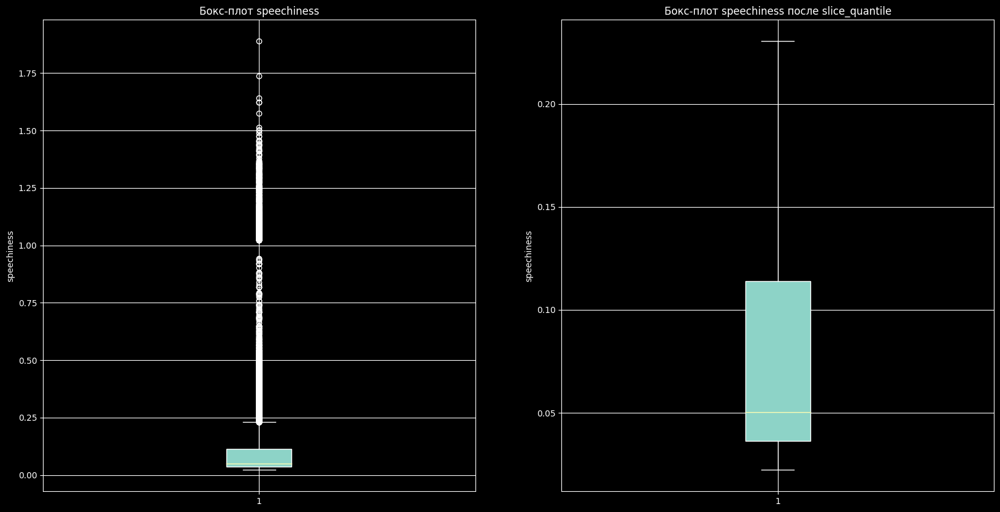

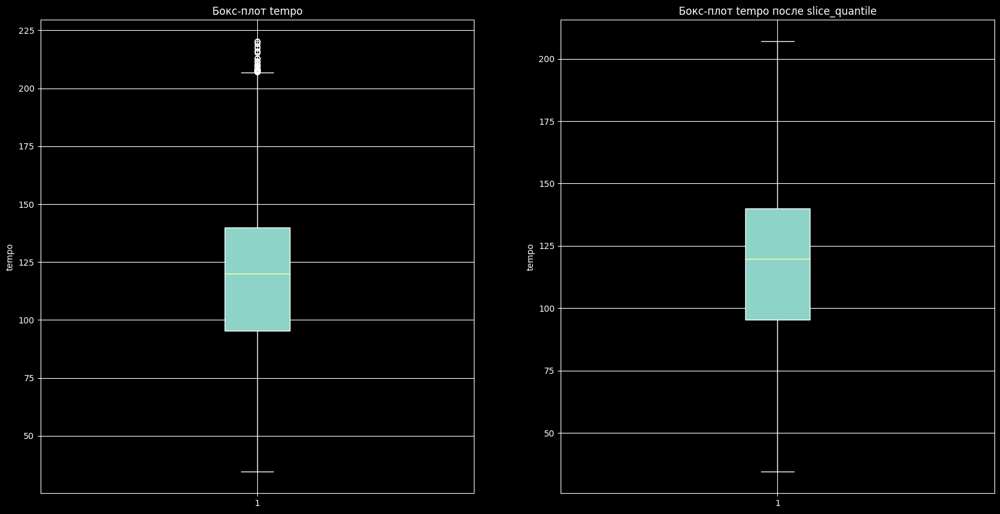

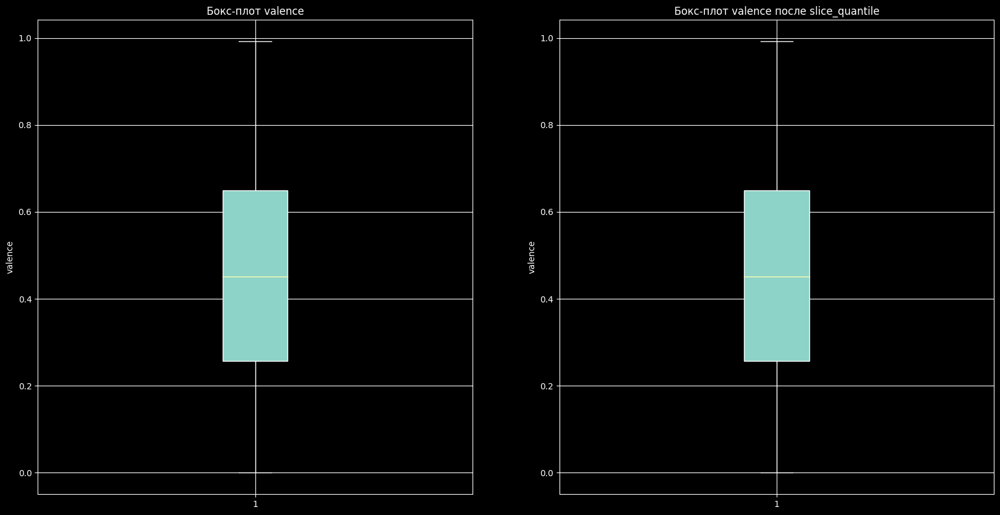

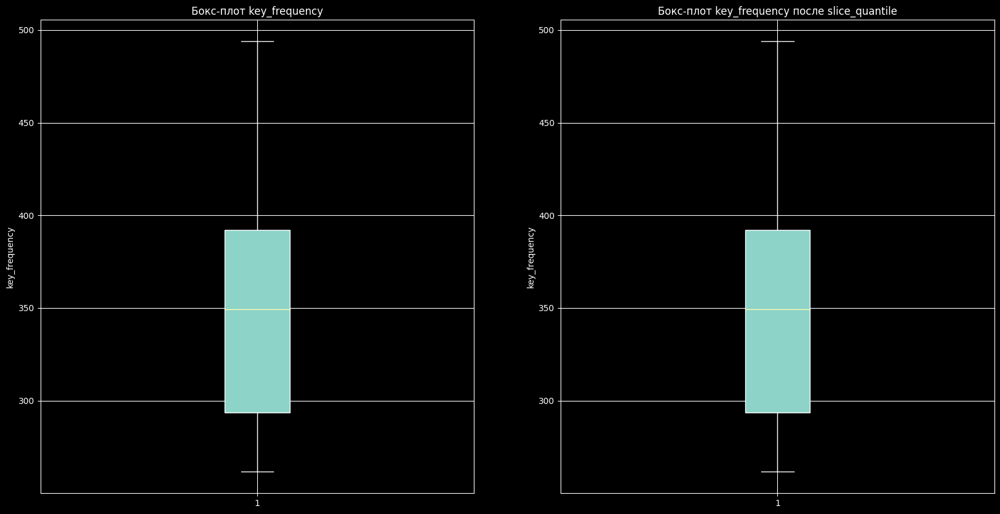

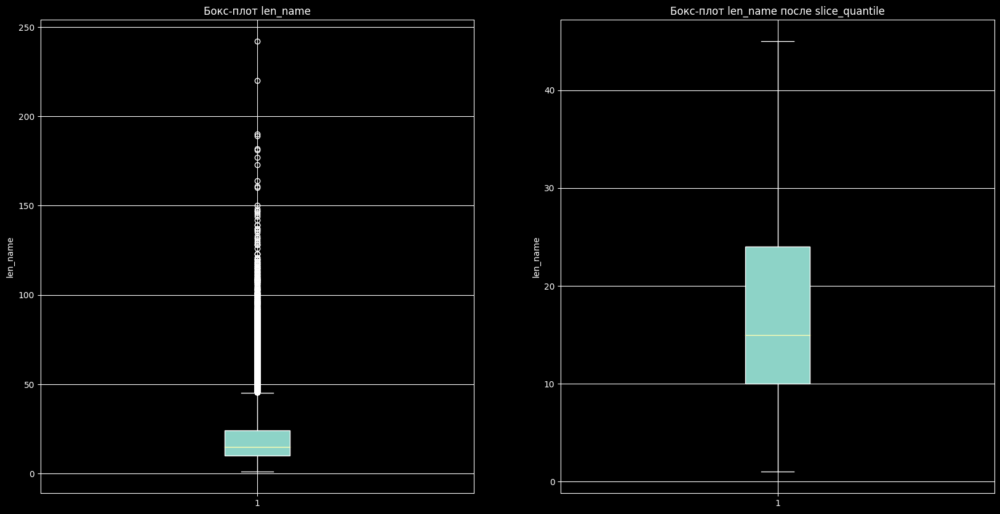

In [ ]:
for colum in num_columns:
    fig, ax = plt.subplots(nrows=1, ncols=2, figsize=(20, 10))

    ax[0].boxplot(X_train[colum], patch_artist=True)
    ax[0].set_ylabel(colum)
    ax[0].set_title('Бокс-плот ' + colum)
    ax[0].grid(True)

    ax[1].boxplot(X_train_sq[colum], patch_artist=True)
    ax[1].set_ylabel(colum)
    ax[1].set_title('Бокс-плот ' + colum + ' после slice_quantile')
    ax[1].grid(True)
    plt.show()
    print()

Обработка аномальных значений весомую прибавку в точности предсказаний не дала, данные в рамках аномальных значений оставленны как есть

### Полиномиальные признаки

Подберем параметры модели LogisticRegression и на основании показаний метрики этой модели подберем значения селектора после добавления полиномиальных 'Фич' 2-го порядка

In [ ]:
param_grid = [
    # словарь для модели LogisticRegression()
    {
        'models': [LogisticRegression(random_state=42)],
        'models__C': [0.01, 0.1, 1, 10],
        'models__penalty': ['l1', 'l2', 'elasticnet', 'None'],
        'models__solver': ['lbfgs', 'liblinear', 'newton-cg', 'newton-cholesky', 'sag', 'saga']
    }
]

randomized_search = RandomizedSearchCV(
    pipe_final,
    param_grid,
    cv=3,
    n_iter=10,
    scoring='roc_auc_ovo',
    random_state=42,
    n_jobs=-1
)
randomized_search.fit(X_train, y_train_label)
print('Лучшая модель и её параметры:\n\n', randomized_search.best_estimator_)
print ('Метрика лучшей модели на кросс-валидации:', randomized_search.best_score_)

Лучшая модель и её параметры:

 Pipeline(steps=[('preprocessor',
                 ColumnTransformer(remainder='passthrough',
                                   transformers=[('ohe',
                                                  Pipeline(steps=[('simpleImputer_ohe',
                                                                   SimpleImputer(strategy='most_frequent')),
                                                                  ('ohe',
                                                                   OneHotEncoder(drop='first',
                                                                                 handle_unknown='ignore',
                                                                                 sparse=False))]),
                                                  ['mode', 'obtained_date']),
                                                 ('ord',
                                                  Pipeline(steps=[('simpleImputer_before_ord',
                 

p.s. - Значения цикла подбора селектора взято на 4 итерации для ускорения работы тетрадки (перебирал значения от 1 до len(X_test_num_scaled_poly.columns)

In [ ]:
X_train_scaled = pd.DataFrame(data_preprocessor.fit_transform(X_train), columns=data_preprocessor.fit(X_train).get_feature_names_out())
X_train_num_scaled = X_train_scaled.drop(columns=['ohe__mode_Minor', 'ohe__obtained_date_3-Apr', 'ohe__obtained_date_4-Apr', 'ohe__obtained_date_5-Apr'])

X_test_scaled = pd.DataFrame(data_preprocessor.fit_transform(X_test.drop(['instance_id', 'track_name', 'key'], axis=1)
), columns=data_preprocessor.fit(X_test.drop(['instance_id', 'track_name', 'key'], axis=1)).get_feature_names_out())
X_test_num_scaled = X_test_scaled.drop(columns=['ohe__mode_Minor', 'ohe__obtained_date_3-Apr', 'ohe__obtained_date_4-Apr', 'ohe__obtained_date_5-Apr'])

poly = PolynomialFeatures(2)
X_train_num_scaled_poly = poly.fit_transform(X_train_num_scaled)
X_test_num_scaled_poly = poly.transform(X_test_num_scaled)

X_train_num_scaled_poly = pd.DataFrame(X_train_num_scaled_poly, columns=poly.get_feature_names_out())
X_test_num_scaled_poly = pd.DataFrame(X_test_num_scaled_poly, columns=poly.get_feature_names_out())

l_score = []

for i in range(74, 78):

    selector = SelectKBest(f_classif, k=i)
    selector.fit(X_train_num_scaled_poly, y_train_label)
    features_names = X_train_num_scaled_poly.columns[selector.get_support(indices=True)]
    X_train_num_scaled_poly_sel = X_train_num_scaled_poly[list(features_names)]
    X_test_num_scaled_poly_sel = X_test_num_scaled_poly[list(features_names)]

    X_train_ = pd.concat([X_train_num_scaled_poly_sel, X_train_scaled[['ohe__mode_Minor', 'ohe__obtained_date_3-Apr', 'ohe__obtained_date_4-Apr', 'ohe__obtained_date_5-Apr']]], axis=1)
    X_test_ = pd.concat([X_test_num_scaled_poly_sel, X_test_scaled[['ohe__mode_Minor', 'ohe__obtained_date_3-Apr', 'ohe__obtained_date_4-Apr', 'ohe__obtained_date_5-Apr']]], axis=1)

    model = LogisticRegression(C=10, random_state=42, solver='newton-cg')

    score = cross_val_score(model, X_train_, y_train_label, scoring='roc_auc_ovo')
    score = np.mean(score)
    l_score.append(score)

    print(i)
    print(f"Метрика ROC-AUC OVO: {score}")

74
Метрика ROC-AUC OVO: 0.8951736509297976
75
Метрика ROC-AUC OVO: 0.8951629969267632
76
Метрика ROC-AUC OVO: 0.8952513630008998
77
Метрика ROC-AUC OVO: 0.895227157221018


Наблюдаем улучшение значения целевой метрики

Посмотрим на хит-мап признаков корреляци Пирсона, для отслеживания мультиколлинеарности

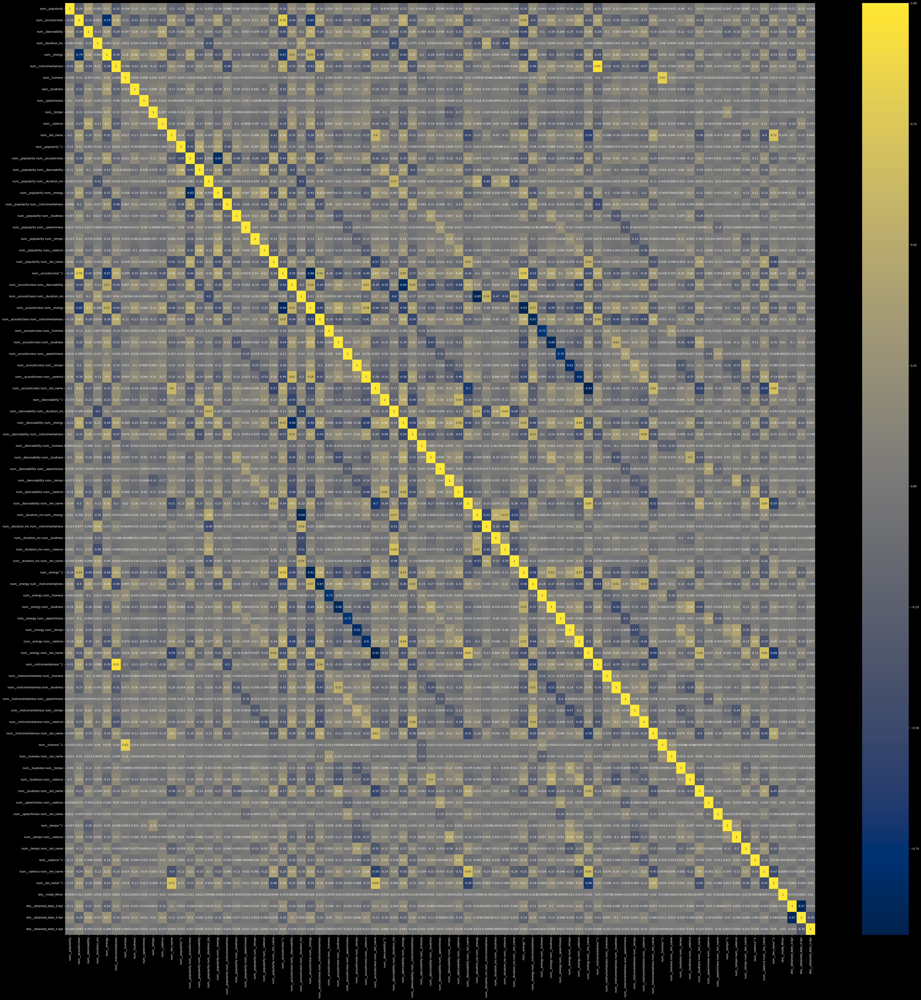

In [ ]:
fig, ax = plt.subplots(figsize=(60, 60))
sns.heatmap(X_train_.corr(),annot=True, cmap='cividis').legend = False

Присутсвуют значения корреляции свыше 0.9, необходимо будет их отсеять

Собираем в пайплайн обработки кол-ых переменных: добавление полиномов, применение селектора на 76 признаков и отсеивание признаков с корреляцией >= 0.9

In [ ]:
num_pipe = make_pipeline(KNNImputer(n_neighbors=2, weights="uniform"),
                         StandardScaler(),
                         PolynomialFeatures(2),
                         SelectKBest(f_classif, k=76),
                         DropCorrelatedFeatures(threshold=0.9))

In [ ]:
data_preprocessor = ColumnTransformer(
    [('ohe', ohe_pipe, ohe_columns),
     ('ord', ord_pipe, ord_columns),
     ('num', num_pipe, num_columns)
    ],
    remainder='passthrough'
)

In [ ]:
pipe_final = Pipeline([
    ('preprocessor', data_preprocessor),
    ('models', LogisticRegression(C=10, random_state=42, solver='newton-cg'))
])

In [ ]:
pipe_final

Pipeline(steps=[('preprocessor',
                 ColumnTransformer(remainder='passthrough',
                                   transformers=[('ohe',
                                                  Pipeline(steps=[('simpleImputer_ohe',
                                                                   SimpleImputer(strategy='most_frequent')),
                                                                  ('ohe',
                                                                   OneHotEncoder(drop='first',
                                                                                 handle_unknown='ignore',
                                                                                 sparse=False))]),
                                                  ['mode', 'obtained_date']),
                                                 ('ord',
                                                  Pipeline(steps=[('simpleImputer_before_ord',
                                                                   SimpleImputer(strategy='m...
                                                                   PolynomialFeatures()),
                                                                  ('selectkbest',
                                                                   SelectKBest(k=76)),
                                                                  ('dropcorrelatedfeatures',
                                                                   DropCorrelatedFeatures(threshold=0.9))]),
                                                  ['popularity', 'acousticness',
                                                   'danceability',
                                                   'duration_ms', 'energy',
                                                   'instrumentalness',
                                                   'liveness', 'loudness',
                                                   'speechiness', 'tempo',
                                                   'valence', 'key_frequency',
                                                   'len_name'])])),
                ('models',
                 LogisticRegression(C=10, random_state=42,
                                    solver='newton-cg'))])

### Ансамблевые методы

#### Бэггинг

Обучим алгоритм RandomForestClassifier

In [ ]:
pipe_final = Pipeline([
    ('preprocessor', data_preprocessor),
    ('models', RandomForestClassifier(random_state=42))
])

param_grid = [
    # словарь для модели RandomForestClassifier()
    {
        'models': [RandomForestClassifier(random_state=42)],
        'models__min_samples_leaf': range(1, 20),
        'models__max_depth': range(2, 30),
        'models__min_samples_split': range(2, 20),
        'models__max_features': range(2, 13),
        'models__n_estimators': range(10, 101),
        'models__criterion': ['gini', 'entropy', 'log_loss']
        }
]

randomized_search_rf = RandomizedSearchCV(
    pipe_final,
    param_grid,
    cv=3,
    n_iter=10,
    scoring='roc_auc_ovo',
    random_state=42,
    n_jobs=-1
)

randomized_search_rf.fit(X_train, y_train_label)
print('Лучшая модель и её параметры:\n\n', randomized_search_rf.best_estimator_)
print ('Метрика лучшей модели на кросс-валидации:', randomized_search_rf.best_score_)

Лучшая модель и её параметры:

 Pipeline(steps=[('preprocessor',
                 ColumnTransformer(remainder='passthrough',
                                   transformers=[('ohe',
                                                  Pipeline(steps=[('simpleImputer_ohe',
                                                                   SimpleImputer(strategy='most_frequent')),
                                                                  ('ohe',
                                                                   OneHotEncoder(drop='first',
                                                                                 handle_unknown='ignore',
                                                                                 sparse=False))]),
                                                  ['mode', 'obtained_date']),
                                                 ('ord',
                                                  Pipeline(steps=[('simpleImputer_before_ord',
                 

#### Бустинг

Обучим алгоритм CatBoostClassifier, подберем learning_rate для нахождения минимума функции ошибки. Пересоберем пайплайн для этого алгоритма ибо он требует данные валидации (DropCorrelatedFeatures(threshold=0.9) по разному отработает на данных тренировки и теста), из-за несоответствия признаков ячейка выдаст ошибку

In [ ]:
X_train_cat, X_val_cat, y_train_cat, y_val_cat = train_test_split(
    X_train,
    y_train_label,
    test_size = 0.2,
    random_state = 42,
    stratify = y_train_label)

In [ ]:
num_pipe_ = Pipeline(
    [('knnimputer_num', KNNImputer(n_neighbors=2, weights="uniform")),
     ('num', StandardScaler())
    ]
    )

data_preprocessor_ = ColumnTransformer(
    [('ohe', ohe_pipe, ohe_columns),
     ('ord', ord_pipe, ord_columns),
     ('num', num_pipe_, num_columns)
    ],
    remainder='passthrough'
)

pipe_final_ = Pipeline([
    ('preprocessor', data_preprocessor_),
    ('models', CatBoostClassifier(
        iterations=500,
        random_seed=42,
        use_best_model=True
        ))
])

param_grid = [
    # словарь для модели CatBoostClassifier()
    {
        'models__learning_rate': [i/100 for i in range(1, 50)]
    }
]

randomized_search_cat = RandomizedSearchCV(
    pipe_final_,
    param_grid,
    cv=3,
    n_iter=10,
    scoring='roc_auc_ovo',
    random_state=42,
    n_jobs=-1
)

randomized_search_cat.fit(X_train_cat, y_train_cat, models__verbose=False,
                          models__eval_set=(data_preprocessor_.fit_transform(X_val_cat), y_val_cat))
print('Лучшая модель и её параметры:\n\n', randomized_search_cat.best_estimator_.get_params())
print ('Метрика лучшей модели на кросс-валидации:', randomized_search_cat.best_score_)

Лучшая модель и её параметры:

 {'memory': None, 'steps': [('preprocessor', ColumnTransformer(remainder='passthrough',
                  transformers=[('ohe',
                                 Pipeline(steps=[('simpleImputer_ohe',
                                                  SimpleImputer(strategy='most_frequent')),
                                                 ('ohe',
                                                  OneHotEncoder(drop='first',
                                                                handle_unknown='ignore',
                                                                sparse=False))]),
                                 ['mode', 'obtained_date']),
                                ('ord',
                                 Pipeline(steps=[('simpleImputer_before_ord',
                                                  SimpleImputer(strategy='most_frequent')),
                                                 ('ord',
                                            

#### Стекинг

Подберем лучшие параметры каждой модели для использования их в ансамбле

In [ ]:
param_grid = [
    # словарь для модели KNeighborsClassifier()
    {
        'models': [KNeighborsClassifier()],
        'models__n_neighbors': range(1, 200, 5),
        'models__metric': ['euclidean', 'cityblocks']
    }
]

randomized_search = RandomizedSearchCV(
    pipe_final,
    param_grid,
    cv=3,
    n_iter=10,
    scoring='roc_auc_ovo',
    random_state=42,
    n_jobs=-1
)
randomized_search.fit(X_train, y_train_label)
print('Лучшая модель и её параметры:\n\n', randomized_search.best_estimator_)
print ('Метрика лучшей модели на кросс-валидации:', randomized_search.best_score_)

Лучшая модель и её параметры:

 Pipeline(steps=[('preprocessor',
                 ColumnTransformer(remainder='passthrough',
                                   transformers=[('ohe',
                                                  Pipeline(steps=[('simpleImputer_ohe',
                                                                   SimpleImputer(strategy='most_frequent')),
                                                                  ('ohe',
                                                                   OneHotEncoder(drop='first',
                                                                                 handle_unknown='ignore',
                                                                                 sparse=False))]),
                                                  ['mode', 'obtained_date']),
                                                 ('ord',
                                                  Pipeline(steps=[('simpleImputer_before_ord',
                 

In [ ]:
param_grid = [
    # словарь для модели LogisticRegression()
    {
        'models': [LogisticRegression(random_state=42)],
        'models__C': [0.01, 0.1, 1, 10],
        'models__penalty': ['l1', 'l2', 'elasticnet', 'None'],
        'models__solver': ['lbfgs', 'liblinear', 'newton-cg', 'newton-cholesky', 'sag', 'saga']
    }
]

randomized_search = RandomizedSearchCV(
    pipe_final,
    param_grid,
    cv=3,
    n_iter=10,
    scoring='roc_auc_ovo',
    random_state=42,
    n_jobs=-1
)
randomized_search.fit(X_train, y_train_label)
print('Лучшая модель и её параметры:\n\n', randomized_search.best_estimator_)
print ('Метрика лучшей модели на кросс-валидации:', randomized_search.best_score_)

Лучшая модель и её параметры:

 Pipeline(steps=[('preprocessor',
                 ColumnTransformer(remainder='passthrough',
                                   transformers=[('ohe',
                                                  Pipeline(steps=[('simpleImputer_ohe',
                                                                   SimpleImputer(strategy='most_frequent')),
                                                                  ('ohe',
                                                                   OneHotEncoder(drop='first',
                                                                                 handle_unknown='ignore',
                                                                                 sparse=False))]),
                                                  ['mode', 'obtained_date']),
                                                 ('ord',
                                                  Pipeline(steps=[('simpleImputer_before_ord',
                 

In [ ]:
param_grid = [
    # словарь для модели SVC()
    {
        'models': [SVC(random_state=42, probability=True)],
        'models__kernel': ['rbf', 'poly', 'linear', 'sigmoid'],
        'models__C': [0.01, 0.1, 1, 10],
        'models__degree': range(1, 4),
        'models__gamma': ['scale', 'auto']
    }
]

randomized_search = RandomizedSearchCV(
    pipe_final,
    param_grid,
    cv=3,
    n_iter=10,
    scoring='roc_auc_ovo',
    random_state=42,
    n_jobs=-1
)
randomized_search.fit(X_train, y_train_label) # выполняется 2-3 часа
print('Лучшая модель и её параметры:\n\n', randomized_search.best_estimator_)
print ('Метрика лучшей модели на кросс-валидации:', randomized_search.best_score_)

In [ ]:
estimators = [('rf', RandomForestClassifier(criterion='log_loss', max_depth=13,
                                        max_features=10, min_samples_leaf=9,
                                        min_samples_split=19, n_estimators=73,
                                        random_state=42)),
              ('svc', SVC(C=10, degree=2, probability=True, random_state=42)),
              ('kn', KNeighborsClassifier(metric='euclidean', n_neighbors=91)),
              ('lr', LogisticRegression(C=10, random_state=42, solver='newton-cg'))]
modelClf = StackingClassifier(estimators=estimators, final_estimator=LogisticRegression(random_state=42))

pipe_final = Pipeline([
    ('preprocessor', data_preprocessor),
    ('models', modelClf)
])

param_grid = [
    # словарь для модели StackingClassifier()
    {}
]

randomized_search_stack = RandomizedSearchCV(
    pipe_final,
    param_grid,
    cv=5,
    n_iter=1,
    scoring='roc_auc_ovo',
    random_state=42,
    n_jobs=-1
)

randomized_search_stack.fit(X_train, y_train_label) # выполняется 2-3 часа
print('Лучшая модель и её параметры:\n\n', randomized_search_stack.best_estimator_.get_params())
print ('Метрика лучшей модели на кросс-валидации:', randomized_search_stack.best_score_)

### Предсказание лучшей модели

Лучшей оказалась модель градиентного бустинга CatBoostClassifier, метрика ROC AUC OVO 0.922

In [ ]:
pred = randomized_search_cat.predict(X_test.drop(['instance_id', 'track_name', 'key'], axis=1))
pred.shape

(10000, 1)

In [ ]:
predict =  label_encoder.inverse_transform(pd.Series(pred[:, 0]))
predict

array(['Anime', 'Country', 'Rock', ..., 'Electronic', 'Anime',
       'Electronic'], dtype=object)

In [ ]:
predict = pd.concat([X_test['instance_id'], pd.Series(predict)], axis=1)
predict

,instance_id,0
0,32911,Anime
1,30681,Country
2,9640,Rock
3,40204,Rock
4,11034,Rap
...,...,...
9995,39792,Electronic
9996,35928,Rock
9997,16758,Electronic
9998,18788,Anime


In [ ]:
predict = predict.rename(columns={0: 'music_genre'})
predict

,instance_id,music_genre
0,32911,Anime
1,30681,Country
2,9640,Rock
3,40204,Rock
4,11034,Rap
...,...,...
9995,39792,Electronic
9996,35928,Rock
9997,16758,Electronic
9998,18788,Anime


In [ ]:
y_test

,instance_id,music_genre
0,32911,Rap
1,30681,Country
2,9640,Classical
3,40204,Anime
4,11034,Country
...,...,...
9995,39792,Jazz
9996,35928,Blues
9997,16758,Country
9998,18788,Classical


In [ ]:
predict.to_csv(r'/content/drive/MyDrive/csv/pred_music_ganre.csv', index= False )

In [ ]:
load_pred = pd.read_csv('/content/drive/MyDrive/csv/pred_music_ganre.csv')

In [ ]:
load_pred

,instance_id,music_genre
0,32911,Anime
1,30681,Country
2,9640,Rock
3,40204,Rock
4,11034,Rap
...,...,...
9995,39792,Electronic
9996,35928,Rock
9997,16758,Electronic
9998,18788,Anime


### Общий вывод

В проделанной работе есть промежуточные выводы, в общем выводе я бы хотел обобщить их и подвести итог по работе с данными

<h4>Загрузка данных</h4>

**Данные представленны в 3 файлах:**

-В первой таблице тестовые данные, 5 колонок типа object, 1 колонка типа int, 10 колонок типа float, 10000 строк

-Вторая таблица состоит из тренировачных данных, колонки идентичны первой таблице, включая целевой признак music_genre(категориальный признак), 40000 строк

-Третья таблица состоит из id и целевого признака тренировачных данных, 10000 строк

<h4>Предобработка данных</h4>

Есть пропуски в данных, заполнение реализованно внутри пайплайна

Была проведена работа по приведению значений '?' к nan категориальной переменной tempo

Типы данных в фреймах приведенны к корректным(колонка tempo изменен тип данных на float)

Значение колонки key-базовый ключ (нота) произведения преобразован в новый признак с частотой ноты (взятой в первой октаве), тк частота содержет больше информации для модели нежели категориальный признак

Заменено некоректное значение '0/4' на nan

Добавлен новый признак со значением длины названия трека взятого с признака track_name

<h4>Исследовательский анализ данных(train)</h4>

Проведено исследование **категориальных признаков:**

-Значения 'key'(базовый ключ произведения) ноты распределенны +- равномерно по данным тренировочного датасета

-Значения 'mode'(модальность трека) преобладает мажорная модальность в треках(64.3%), минорная (35.7%)

-Значения 'obtained_date'(дата загрузки в сервис) в основном все треки в сервис загрузили 4 апреля(89.5%), 3 апреля (8.1%). 1 апреля, 5 апреля загруженно остаточные ~ 2% треков

-Значения цeлевого признака 'music_genre '(Музыкальный жанр трека) почти идеально сбалансированны по данным 9.9-10.1%, таковых значений 10

Исследование **кол-ых признаков:**

-**'popularity'**(Популярность трека) напоминает нормальное распределение разброс варьируется от 0 до 99, в среднем 44

Присутсвуют слегка выбивающиеся значения по обе стороны распределения

-**'acousticness'**(Мера уверенности) напоминает распределение Пуасона со 'скосом' к левому краю разброс варьируется от 0 до 1, в среднем 0.3

Аномальных значений не наблюдаем

-**'danceability'**(Танцевальность) напоминает нормальное распределение разброс варьируется от 0.05 до 0.98, в среднем 0.55

Значения находящиеся в левой части распределения слегка выбиваются из общей массы

-**'duration_ms'**(Продолжительность трека в миллисекундах) напоминает распределение Пуасона смещенное к левому краю разброс варьируется от -1 до 4830000, в среднем 221000

Есть аномальные значения по правому краю распределения

-**'energy'**(Энергия) напоминает нормальное распределение смещенное к правому краю разброс варьируется от 0 до 0.99, в среднем 0.6

Аномальных значений не наблюдаем

-**'instrumentalness'**(содержит ли трек вокал)  напоминает распределение Пуасона смещенное к левому краю разброс варьируется от 0 до 0.99, в среднем 0.18

Есть аномальные значения по правому краю распределения

-**'liveness'**(присутствие аудитории в записи)  напоминает распределение Пуасона смещенное к левому краю разброс варьируется от 0 до 1, в среднем 0.19

Есть аномальные значения по правому краю распределения

-**'loudness'**(Общая громкость трека в децибелах)  напоминает распределение Пуасона смещенное к правому краю разброс варьируется от -108 до 1.94, в среднем -11

Есть аномальные значения по левому краю распределения

-**'speechiness'**(Речевой характер)  напоминает распределение Пуасона смещенное к левому краю разброс варьируется от 0.02 до 1.88, в среднем 0.12

Есть аномальные значения по правому краю распределения

-**'tempo'**(Темп трека в ударах в минуту) напоминает нормальное распределение разброс варьируется от 34 до 220, в среднем 119

Значения находящиеся в правой части распределения слегка выбиваются из общей массы

-**'valence'**(музыкальный позитив) напоминает нормальное распределение разброс варьируется от 0 до 0.99, в среднем 0.45

Аномальных значений не наблюдаем

-**'len_name'**(длина названия трека) напоминает распределение Пуасона смещенное к левому краю разброс варьируется от 1 до 242, в среднем 20

Есть аномальные значения по правому краю распределения

<h4>Исследовательский анализ данных (test)</h4>

Проведено исследование **категориальных признаков:**

-Значения 'key'(базовый ключ произведения) ноты распределенны +- равномерно по данным тестового датасета за исключением D#(3.4%)

-Значения 'mode'(модальность трека) преобладает мажорная модальность в треках(63.9%), минорная (36.1%)

-Значения 'obtained_date'(дата загрузки в сервис) в основном все треки в сервис загрузили 4 апреля(89.5%), 3 апреля (8.4%). 1 апреля, 5 апреля загруженно остаточные ~ 2% треков

-Значения цeлевого признака 'music_genre '(Музыкальный жанр трека) чуть больше разбалансированны по данным 9.4-10.4% в сравнении с тренировочными данными, 10 значений признака

Исследование **кол-ых признаков:**

-**'popularity'**(Популярность трека) напоминает нормальное распределение разброс варьируется от 0 до 96, в среднем 44

Присутсвуют слегка выбивающиеся значения по обе стороны распределения

-**'acousticness'**(Мера уверенности) напоминает распределение Пуасона со 'скосом' к левому краю разброс варьируется от 0 до 1, в среднем 0.3

Аномальных значений не наблюдаем

-**'danceability'**(Танцевальность) напоминает нормальное распределение разброс варьируется от 0.06 до 0.98, в среднем 0.55

Значения находящиеся в левой части распределения слегка выбиваются из общей массы

-**'duration_ms'**(Продолжительность трека в миллисекундах) напоминает распределение Пуасона смещенное к левому краю разброс варьируется от -1 до 2294000, в среднем 219000

Есть аномальные значения по правому краю распределения

-**'energy'**(Энергия) напоминает нормальное распределение смещенное к правому краю разброс варьируется от 0 до 0.99, в среднем 0.59

Аномальных значений не наблюдаем

-**'instrumentalness'**(содержит ли трек вокал)  напоминает распределение Пуасона смещенное к левому краю разброс варьируется от 0 до 0.99, в среднем 0.18

Есть аномальные значения по правому краю распределения

-**'liveness'**(присутствие аудитории в записи)  напоминает распределение Пуасона смещенное к левому краю разброс варьируется от 0.13 до 0.99, в среднем 0.19

Есть аномальные значения по правому краю распределения

-**'loudness'**(Общая громкость трека в децибелах)  напоминает распределение Пуасона смещенное к правому краю разброс варьируется от -104 до 3.74, в среднем -11

Есть аномальные значения по левому краю распределения

-**'speechiness'**(Речевой характер)  напоминает распределение Пуасона смещенное к левому краю разброс варьируется от 0.02 до 1.79, в среднем 0.13

Есть аномальные значения по правому краю распределения

-**'tempo'**(Темп трека в ударах в минуту) напоминает нормальное распределение разброс варьируется от 34 до 220, в среднем 120

Значения находящиеся в правой части распределения слегка выбиваются из общей массы

-**'valence'**(музыкальный позитив) напоминает нормальное распределение разброс варьируется от 0 до 0.99, в среднем 0.45

Аномальных значений не наблюдаем

-**'len_name'**(длина названия трека) напоминает распределение Пуасона смещенное к левому краю разброс варьируется от 1 до 242, в среднем 20

Есть аномальные значения по правому краю распределения

<h4>Корреляционный анализ(train)</h4>

Построен "хитмап" по матрице корреляций Фика, для отслеживания связи признаков с целевой переменной и для отслеживания мультиколлинеарности, мультиколлинеарности в данных не прослеживается

<h4>Корреляционный анализ(test)</h4>

Мультиколлинеарности в данных не прослеживается, наблюдаем значительное уменьшение связи между признаками и таргетом

<h4>Подготовка данных</h4>

345 наблюдений с одинаковыми значениями признаков но с разным значением таргета, оставленны без изменения

Был закодирован целевой признак при помощи LabelEncoder

Данные хорошо сбалансированны по целевому признаку

Создан пайплайн для предобработки данных

<h4>Обучение моделей</h4>

Заданы параметры для кросс-валидации и перебора моделей с гиперпараметрами

При помощи RandomizedSearchCV подобранна модель:DecisionTreeClassifier(max_depth=8, max_features=10, random_state=42) со значением метрики ROC AUC OVO-0.864

<h4>Работа с аномальными значениями</h4>

Применен алгоритм isolationForest для обработки аномальных значений, кол-во семплов которые алгоритм будет считать аномалиями выставлен 5%, идентичный результат целевой метрики как и до применения isolationForest

Проведена обработка аномальных значений функцией slice_quantile, которая приводит аномальные значения к "усам боксплота", незначительная прибавка по целевой метрики на уровне погрешности

Обработка аномальных значений весомую прибавку в точности предсказаний не дала, данные в рамках аномальных значений оставленны как есть

<h4>Полиномиальные признаки</h4>

Введенны полиномиальные признаки 2-го порядка, применен SelectKBest со значением k=76 (сколько признаков оставить). Наблюдается улучшение значения целевой метрики по мнению LogisticRegression(C=10, random_state=42, solver='newton-cg') ROC AUC OVO-0.895

Пайплайн обработки кол-ых переменных обновлен: добавление полиномов, применение селектора на 76 признаков и отсеивание признаков с корреляцией >= 0.9

<h4>Ансамблевые методы</h4>

Обучен алгоритм RandomForestClassifier(criterion='log_loss', max_depth=13,max_features=10, min_samples_leaf=9,min_samples_split=19, n_estimators=73,random_state=42) метрика ROC AUC OVO-0.912

Обучен алгоритм CatBoostClassifier(iterations=500,random_seed=42, use_best_model=True, learning_rate=0.14) метрика ROC AUC OVO-0.922

Обучен ансамбль моделей: RandomForestClassifier(criterion='log_loss', max_depth=13,max_features=10, min_samples_leaf=9,min_samples_split=19, n_estimators=73,random_state=42), SVC(C=10, degree=2, probability=True, random_state=42), KNeighborsClassifier(metric='euclidean', n_neighbors=91),  LogisticRegression(C=10, random_state=42, solver='newton-cg') в качестве мета-оценщика использовалась LogisticRegression(random_state=42). Метрика ROC AUC OVO-0.916

<h4>Предсказание лучше модели</h4>

Лучшей оказалась модель градиентного бустинга CatBoostClassifier, метрика ROC AUC OVO 0.922

Чье предсказание и было использованно для загрузки на конкурс в kaggle